# Проект для фермы "Вольный луг"

*Заказчик: владелец фермы "Вольный луг".* 
Владелец хочет чтобы каждая купленная буренка от ассоциации пастбищ "Экоферма" давала не менее 6000 кг молока соответсвующего критериям качества в год для выполнения плана развития фермерского хозяйства.   
**Цель проекта:** разработать модель машинного обучения для управления рисками и для принятия объективных решений о покупке буренок.    
**План исследования:**  
1. Загрузка и знакомство с данными.
2. Предобработка данных, работа с пропусками и дубликатами.
3. Исследовательский анализ данных, статистическое описание.
4. Корреляционный анализ признаков в датасете.
5. Обучение моделей линейной регрессии.
6. Обучение моделей логистической регрессии.

# Описание данных

**Данные о стаде фермера на текущий момент - `ferma_main.csv`:**
+ `id` - уникальный идентификатор коровы;
+ `Удой, кг` - масса молока от коровы в год;
+ `ЭКЕ (Энергетическая кормовая единица)` - показатель питательности корма коровы;
+ `Сырой протеин, г` - содержание сырого протеина;
+ `СПО (Сахаро-протеиновое соотношение)` - отношение сахара к протеину;
+ `Порода` - порода коровы;
+ `Тип пастбища` - ландшафт лугов, на которых паслась корова;
+ `порода папы_быка` - порода самца от которого появилась корова;
+ `Жирность,%` - содержание жиров в молоке;
+ `Белок,%` -  содержание белка в молоке;
+ `Вкус молока` - оценка вкуса по личным критериям фермера, бинарный признак (вкусно, не вкусно);
+ `Возраст` - возраст коровы, бинарный признак (менее_2_лет, более_2_лет).

**Данные об имени папы каждой коровы в стаде фермера - `ferma_dad.csv`:**
+ `id` - уникальный идентификатор коровы;
+ `Имя Папы` - имя самца являющегося папой.

**Данные о коровах "ЭкоФермы", которых фермер хочет изучить перед покупкой - `cow_buy.csv`:**
+ `Порода` - порода коровы;
+ `Тип пастбища` - ландшафт лугов, на которых паслась корова;
+ `порода папы_быка` - порода самца от которого появилась корова;
+ `Имя Папы` - имя самца являющегося папой4;
+ `Текущая_жирность,%` - содержание жиров в молоке;
+ `Текущий_уровень_белок,%` - содержание белка в молоке;
+ `Возраст` - возраст коровы, бинарный признак (менее_2_лет, более_2_лет).

#  Шаг 1

#### 1.1. Загрузка и первичное знакомство с данными

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
!pip install phik
import phik
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, accuracy_score, precision_score, recall_score, confusion_matrix
RANDOM_STATE = 42

In [2]:
try:
    main = pd.read_csv('/Users/user/Desktop/Курсы/Яндекс/5 спринт/ferma_main.csv')
    dad = pd.read_csv('/Users/user/Desktop/Курсы/Яндекс/5 спринт/ferma_dad.csv')
    cow = pd.read_csv('/Users/user/Desktop/Курсы/Яндекс/5 спринт/cow_buy.csv')
except:
    main = pd.read_csv('/datasets/ferma_main.csv')
    dad = pd.read_csv('/datasets/ferma_dad.csv')
    cow = pd.read_csv('/datasets/cow_buy.csv')
    
pd.options.display.float_format = '{:,.3f}'.format
pd.set_option('display.max_columns', None)

print(display(main.head(5)))
print(display(dad.head(5)))
print(display(cow.head(5)))

,id;Удой,кг;ЭКЕ (Энергетическая кормовая единица);Сырой протеин,г;СПО (Сахаро-протеиновое соотношение);Порода;Тип пастбища;порода папы_быка;Жирность,%;Белок,%;Вкус молока;Возраст
0,1;5863;14,2;1743;0,89;Вис Бик Айдиал;Равнинное;Айдиал;3,58;3,076;вкусно;более_2_лет
1,2;5529;12,8;2138;0,89;Вис Бик Айдиал;Равнинные;Соверин;3,54;3,079;вкусно;менее_2_лет
2,3;5810;14;1854;0,885;РефлешнСоверинг;Холмистое;Соверин;3,59;3,074;не вкусно;более_2_лет,NaN
3,4;5895;12,4;2012;0,885;РефлешнСоверинг;Холмистое;Айдиал;3,4;3,075;не вкусно;более_2_лет
4,5;5302;12,8;1675;0,885;Вис Бик Айдиал;Равнинные;Соверин;3,73;3,073;вкусно;менее_2_лет


None


,id;Имя Папы
0,1;Буйный
1,2;Соловчик
2,3;Барин
3,4;Буйный
4,5;Барин


None


,Порода;Тип пастбища;порода папы_быка;Имя_папы;Текущая_жирность,%;Текущий_уровень_белок,%;Возраст
0,Вис Бик Айдиал;холмистое;Айдиал;Геркулес;3,58;3,076;более_2_лет
1,Вис Бик Айдиал;равнинное;Соверин;Буйный;3,54;3,081;менее_2_лет
2,РефлешнСоверинг;равнинное;Соверин;Барин;3,59;3,074;более_2_лет
3,РефлешнСоверинг;холмистое;Айдиал;Буйный;3,4;3,061;более_2_лет
4,РефлешнСоверинг;равнинное;Айдиал;Буйный;3,64;3,074;более_2_лет


None


Итак, сожержимое датафреймов отобразилось некорректно. Примем меры.

In [3]:
try:
    main = pd.read_csv('/Users/user/Desktop/Курсы/Яндекс/5 спринт/ferma_main.csv', sep=';')
    dad = pd.read_csv('/Users/user/Desktop/Курсы/Яндекс/5 спринт/ferma_dad.csv', sep=';')
    cow = pd.read_csv('/Users/user/Desktop/Курсы/Яндекс/5 спринт/cow_buy.csv', sep=';')
except:
    main = pd.read_csv('/datasets/ferma_main.csv', sep=';')
    dad = pd.read_csv('/datasets/ferma_dad.csv', sep=';')
    cow = pd.read_csv('/datasets/cow_buy.csv', sep=';')
    
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_columns', None)

print(display(main.head(5)))
print(display(dad.head(5)))
print(display(cow.head(5)))

,id,"Удой, кг",ЭКЕ (Энергетическая кормовая единица),"Сырой протеин, г",СПО (Сахаро-протеиновое соотношение),Порода,Тип пастбища,порода папы_быка,"Жирность,%","Белок,%",Вкус молока,Возраст
0,1,5863,"14,2",1743,"0,89",Вис Бик Айдиал,Равнинное,Айдиал,"3,58","3,076",вкусно,более_2_лет
1,2,5529,"12,8",2138,"0,89",Вис Бик Айдиал,Равнинные,Соверин,"3,54","3,079",вкусно,менее_2_лет
2,3,5810,14,1854,"0,885",РефлешнСоверинг,Холмистое,Соверин,"3,59","3,074",не вкусно,более_2_лет
3,4,5895,"12,4",2012,"0,885",РефлешнСоверинг,Холмистое,Айдиал,"3,4","3,075",не вкусно,более_2_лет
4,5,5302,"12,8",1675,"0,885",Вис Бик Айдиал,Равнинные,Соверин,"3,73","3,073",вкусно,менее_2_лет


None


,id,Имя Папы
0,1,Буйный
1,2,Соловчик
2,3,Барин
3,4,Буйный
4,5,Барин


None


,Порода,Тип пастбища,порода папы_быка,Имя_папы,"Текущая_жирность,%","Текущий_уровень_белок,%",Возраст
0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,"3,58","3,076",более_2_лет
1,Вис Бик Айдиал,равнинное,Соверин,Буйный,"3,54","3,081",менее_2_лет
2,РефлешнСоверинг,равнинное,Соверин,Барин,"3,59","3,074",более_2_лет
3,РефлешнСоверинг,холмистое,Айдиал,Буйный,"3,4","3,061",более_2_лет
4,РефлешнСоверинг,равнинное,Айдиал,Буйный,"3,64","3,074",более_2_лет


None


#### 1.2. Изучение данных

In [4]:
print(main.info())
print(dad.info())
print(cow.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 634 entries, 0 to 633
Data columns (total 12 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   id                                     634 non-null    int64 
 1   Удой, кг                               634 non-null    int64 
 2   ЭКЕ (Энергетическая кормовая единица)  634 non-null    object
 3   Сырой протеин, г                       634 non-null    int64 
 4   СПО (Сахаро-протеиновое соотношение)   634 non-null    object
 5   Порода                                 634 non-null    object
 6   Тип пастбища                           634 non-null    object
 7   порода папы_быка                       634 non-null    object
 8   Жирность,%                             634 non-null    object
 9   Белок,%                                634 non-null    object
 10  Вкус молока                            634 non-null    object
 11  Возраст            

Переименуем нозвания столбцов.

In [5]:
new_columns = {
    'Удой, кг': 'yield_kg',
    'ЭКЕ (Энергетическая кормовая единица)': 'eke',
    'Сырой протеин, г': 'protein_g',
    'СПО (Сахаро-протеиновое соотношение)': 'spo',
    'Порода': 'cow_breed',
    'Тип пастбища': 'pasture_type',
    'порода папы_быка': 'dad_breed',
    'Жирность,%': 'fat_share',
    'Текущая_жирность,%': 'fat_share',
    'Белок,%': 'protein_share',
    'Текущий_уровень_белок,%': 'protein_share',
    'Вкус молока': 'taste',
    'Возраст': 'age',
    'Имя Папы': 'dad_name',
    'Имя_папы': 'dad_name',
}

main.rename(columns=new_columns, inplace=True)
dad.rename(columns=new_columns, inplace=True)
cow.rename(columns=new_columns, inplace=True)

Проверим изменения.

In [6]:
print(display(main.head(1), dad.head(1), cow.head(1)))

,id,yield_kg,eke,protein_g,spo,cow_breed,pasture_type,dad_breed,fat_share,protein_share,taste,age
0,1,5863,"14,2",1743,"0,89",Вис Бик Айдиал,Равнинное,Айдиал,"3,58","3,076",вкусно,более_2_лет


,id,dad_name
0,1,Буйный


,cow_breed,pasture_type,dad_breed,dad_name,fat_share,protein_share,age
0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,"3,58","3,076",более_2_лет


None


#### 1.3. Промежуточный вывод

**Цель:** загрузить данные и ознакомиться с общей информацией датафреймов.  
**Результаты:**
1) Установили объем данных: 
- `main` 12 столбцов, 634 строки.
- `dad` 2 столбца 629 строк.
- `cow` 7 столбцов 20 строк.

2) Переименовали столбцы во всех трех датафрейма в соответствии со snake_case.

# Шаг 2

#### 2.1. Предобработка данных

Изучим типы данных.

In [7]:
print(main.info(), dad.info(), cow.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 634 entries, 0 to 633
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   id             634 non-null    int64 
 1   yield_kg       634 non-null    int64 
 2   eke            634 non-null    object
 3   protein_g      634 non-null    int64 
 4   spo            634 non-null    object
 5   cow_breed      634 non-null    object
 6   pasture_type   634 non-null    object
 7   dad_breed      634 non-null    object
 8   fat_share      634 non-null    object
 9   protein_share  634 non-null    object
 10  taste          634 non-null    object
 11  age            634 non-null    object
dtypes: int64(3), object(9)
memory usage: 59.6+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 629 entries, 0 to 628
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        629 non-null    int64 
 1   dad_name  629 non-n

Внесем измения в типы данных.

In [8]:
# main
main['eke'] = main['eke'].astype(str).str.replace(',', '.').astype(float)
main['spo'] = main['spo'].astype(str).str.replace(',', '.').astype(float)
main['fat_share'] = main['fat_share'].astype(str).str.replace(',', '.').astype(float)
main['protein_share'] = main['protein_share'].astype(str).str.replace(',', '.').astype(float)
# cow
cow['fat_share'] = cow['fat_share'].astype(str).str.replace(',', '.').astype(float)
cow['protein_share'] = cow['protein_share'].astype(str).str.replace(',', '.').astype(float)
pd.options.display.float_format = '{:,.3f}'.format

In [9]:
print(main.info(), dad.info(), cow.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 634 entries, 0 to 633
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             634 non-null    int64  
 1   yield_kg       634 non-null    int64  
 2   eke            634 non-null    float64
 3   protein_g      634 non-null    int64  
 4   spo            634 non-null    float64
 5   cow_breed      634 non-null    object 
 6   pasture_type   634 non-null    object 
 7   dad_breed      634 non-null    object 
 8   fat_share      634 non-null    float64
 9   protein_share  634 non-null    float64
 10  taste          634 non-null    object 
 11  age            634 non-null    object 
dtypes: float64(4), int64(3), object(5)
memory usage: 59.6+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 629 entries, 0 to 628
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        629 non-null    int64

Проверим данные на наличие явных и неявных дубликатов.

In [10]:
print(f'Количество выявленных явных дубликатов в данных о стаде фермера: {main.duplicated().sum()}')
print(f'Количество выявленных явных дубликатов в данных о папах коров в стаде фермера: {dad.duplicated().sum()}')
print(f'Количество выявленных явных дубликатов в данных о коровах "ЭкоФермы": {cow.duplicated().sum()}')

Количество выявленных явных дубликатов в данных о стаде фермера: 5
Количество выявленных явных дубликатов в данных о папах коров в стаде фермера: 0
Количество выявленных явных дубликатов в данных о коровах "ЭкоФермы": 4


Ознакомимся с выявлеными явными дубликатами.

In [11]:
print(display(main[main.duplicated(keep=False)]))
print(display(cow[cow.duplicated(keep=False)]))

,id,yield_kg,eke,protein_g,spo,cow_breed,pasture_type,dad_breed,fat_share,protein_share,taste,age
626,627,5970,14.400,1837,0.880,РефлешнСоверинг,Холмистое,Соверин,3.640,3.075,не вкусно,более_2_лет
629,627,5970,14.400,1837,0.880,РефлешнСоверинг,Холмистое,Соверин,3.640,3.075,не вкусно,более_2_лет
630,627,5970,14.400,1837,0.880,РефлешнСоверинг,Холмистое,Соверин,3.640,3.075,не вкусно,более_2_лет
631,627,5970,14.400,1837,0.880,РефлешнСоверинг,Холмистое,Соверин,3.640,3.075,не вкусно,более_2_лет
632,627,5970,14.400,1837,0.880,РефлешнСоверинг,Холмистое,Соверин,3.640,3.075,не вкусно,более_2_лет
633,627,5970,14.400,1837,0.880,РефлешнСоверинг,Холмистое,Соверин,3.640,3.075,не вкусно,более_2_лет


None


,cow_breed,pasture_type,dad_breed,dad_name,fat_share,protein_share,age
0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,3.580,3.076,более_2_лет
2,РефлешнСоверинг,равнинное,Соверин,Барин,3.590,3.074,более_2_лет
4,РефлешнСоверинг,равнинное,Айдиал,Буйный,3.640,3.074,более_2_лет
6,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,3.580,3.076,более_2_лет
8,РефлешнСоверинг,равнинное,Соверин,Барин,3.590,3.074,более_2_лет
14,РефлешнСоверинг,равнинное,Соверин,Барин,3.590,3.074,более_2_лет
19,РефлешнСоверинг,равнинное,Айдиал,Буйный,3.640,3.074,более_2_лет


None


Удалим дублирующиеся строки сохранив первую встречающуюся запись из дубликатов, так как датафреймы небольшошго размера. 

In [12]:
print(f'Размеры датафреймa до удаления дублирующихся строк - {main.shape, cow.shape}')

main = main.drop_duplicates(keep='first').reset_index()
cow = cow.drop_duplicates(keep='first').reset_index()

print(f'Размеры датафреймa после удаления дублирующихся строк - {main.shape, cow.shape}')

print(f'Количество выявленных явных дубликатов в данных о стаде фермера: {main.duplicated().sum()}')
print(f'Количество выявленных явных дубликатов в данных о коровах "ЭкоФермы": {cow.duplicated().sum()}')

Размеры датафреймa до удаления дублирующихся строк - ((634, 12), (20, 7))
Размеры датафреймa после удаления дублирующихся строк - ((629, 13), (16, 8))
Количество выявленных явных дубликатов в данных о стаде фермера: 0
Количество выявленных явных дубликатов в данных о коровах "ЭкоФермы": 0


Проведем проверку на неявные дубликаты.

In [13]:
print(main['cow_breed'].unique(), cow['cow_breed'].unique())
print(cow['dad_name'].unique(), dad['dad_name'].unique())
print(main['taste'].unique(), main['age'].unique(), cow['age'].unique())

print(main['dad_breed'].unique(), cow['dad_breed'].unique())
print(main['pasture_type'].unique(), cow['pasture_type'].unique())

['Вис Бик Айдиал' 'РефлешнСоверинг'] ['Вис Бик Айдиал' 'РефлешнСоверинг']
['Геркулес' 'Буйный' 'Барин' 'Соловчик'] ['Буйный' 'Соловчик' 'Барин' 'Геркулес']
['вкусно' 'не вкусно'] ['более_2_лет' 'менее_2_лет'] ['более_2_лет' 'менее_2_лет']
['Айдиал' 'Соверин' 'Айдиалл'] ['Айдиал' 'Соверин']
['Равнинное' 'Равнинные' 'Холмистое'] ['холмистое' 'равнинное']


Обнаружены неявные дубликаты такие как "Айдиал"-"Айдиалл", "равнинное"-"Равнинное"-"равнинные", "Холмистое"-"холмистое".

In [14]:
main['dad_breed'] = main['dad_breed'].replace('Айдиалл', 'Айдиал')
main['pasture_type'] = main['pasture_type'].replace('Равнинные', 'равнинное').str.lower()

print(main['dad_breed'].unique(), cow['dad_breed'].unique())
print(main['pasture_type'].unique(), cow['pasture_type'].unique())

['Айдиал' 'Соверин'] ['Айдиал' 'Соверин']
['равнинное' 'холмистое'] ['холмистое' 'равнинное']


In [15]:
main.describe()

,index,id,yield_kg,eke,protein_g,spo,fat_share,protein_share
count,629.000,629.000,629.000,629.000,629.000,629.000,629.000,629.000
mean,314.000,315.000,"6,188.750",14.544,"1,923.364",0.913,3.604,3.076
std,181.721,181.721,"1,644.795",1.306,182.956,0.032,0.169,0.003
min,0.000,1.000,"5,204.000",10.900,"1,660.000",0.840,2.990,3.069
25%,157.000,158.000,"5,751.000",13.500,"1,771.000",0.890,3.590,3.074
50%,314.000,315.000,"6,133.000",14.700,"1,888.000",0.930,3.650,3.076
75%,471.000,472.000,"6,501.000",15.600,"2,062.000",0.940,3.720,3.077
max,628.000,629.000,"45,616.000",16.800,"2,349.000",0.960,3.750,3.085


Присутствует явный выброс в столбце со значениями удоя.

In [16]:
main.query('yield_kg > 8000')

,index,id,yield_kg,eke,protein_g,spo,cow_breed,pasture_type,dad_breed,fat_share,protein_share,taste,age
16,16,17,45616,11.500,1675,0.930,Вис Бик Айдиал,холмистое,Айдиал,3.220,3.076,вкусно,более_2_лет


Удалим данную строку. Если это случайная ошибка в записи и на самом деле удой составил 4561 кг, то это значение все равно будет являть выбросом, так как минимальный удой у поголовья фермера составляет 5200 кг.

In [17]:
main = main.loc[main['yield_kg'] < 8000].reset_index(drop=True)
print(main.shape)

(628, 13)


#### 2.2. Промежуточный вывод

**Цель:** выполнить предобработку данных.  
**Задачи:**
1. Проверка и исправление типов данных.
2. Выявление и обработка явных и неявных дубликатов.

**Результаты**

1) Проверка и исправление типов данных: 
- Во всех количественных столбцах знак у которых тип данных был `object` знак "," изменен на "." и тип данных изменен на `float`.

2) Выявление и обработка явных и неявных дубликатов:
- Выявлены явные дубликаты в следствие чего в датафрейме `main` удалено 5 строк, а в датафрейме `cow` 4.
- Так же выявлен выброс в столбце с данными о годовом удое - удой в 45 тыс. кг. Строка была удалена.
- Выявлены неявные дубликаты в категориальных столбцах, изменили написание типа пастбища "Равнинное"-"равнинные" на "равнинное" и породу отца коровы с "Айдиалл" на "Айдиал".

# Шаг 3

#### 3.1. Статистический анализ признаков и их визуализация

Напишем две функции для анализа количественных и категориальных признаков.

In [18]:
# функция для категориальных признаков
def categorical_attributes(df, attribute, title):
    '''
    Plots for categorical attributes
        Parameters:
            df: Dataframe
            attribute: Column with attribute
            title: Title of graphs
            
    Returns:
        Series: number of unique values
        plot: pie, boxplot by number of unique values
    '''
    counts = df[attribute].value_counts()
    fig, ax = plt.subplots(figsize=(8, 6))
    wedges, texts, autotexts = ax.pie(counts, labels=counts.index, autopct='%1.1f%%',
                                       startangle=90, colors=sns.color_palette('afmhot_r', len(counts)))

    plt.setp(autotexts, size=12, weight='bold', color='black')
    plt.setp(texts, size=12)
    ax.set_title(title, fontsize=18, fontweight='bold')
    
    plt.figure(figsize=(8, 6)) 
    ax2 = sns.barplot(x=counts.index, y=counts.values, palette='afmhot_r')
    ax2.set_title(title, fontsize=18, fontweight='bold')
    ax2.set_xlabel(attribute, fontsize=14)
    ax2.set_ylabel('Частота', fontsize=14)
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha="right")


    plt.show()
    print(counts)


# функция для количественных признаков
def quantitative_attributes(df, attribute, title, bins=20):
    '''
    Plots for quantitative attributes
        Parameters:
            df: Dataframe
            attribute: Column with attribute
            title: Title of graphs
            bins=20: The number of bins for the histogram
            
    Returns:
        plot: histogram and boxplot
        describe(Series): statistical indicators of the attribute        
    '''
    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 12))
    fig.suptitle(title, fontsize=20,fontweight='bold')
    
    sns.histplot(df[attribute], kde=True, bins=bins, ax=ax[0], color='blue')
    ax[0].set_title('Гистограмма', fontsize=18)
    ax[0].set_xlabel(title, fontsize=15)
    ax[0].set_ylabel('Частота встречаемости признака', fontsize=15)
    
    sns.boxplot(x=df[attribute], ax=ax[1], color='lightgreen')
    ax[1].set_title('Ящик с усами', fontsize=18)
    ax[1].set_xlabel(None)  
    ax[1].set_ylabel(title, fontsize=15)

    plt.tight_layout(rect=[0, 0, 1, 0.95]) 
    plt.show()

    print(df[attribute].describe().T)

**Категориальные признаки**

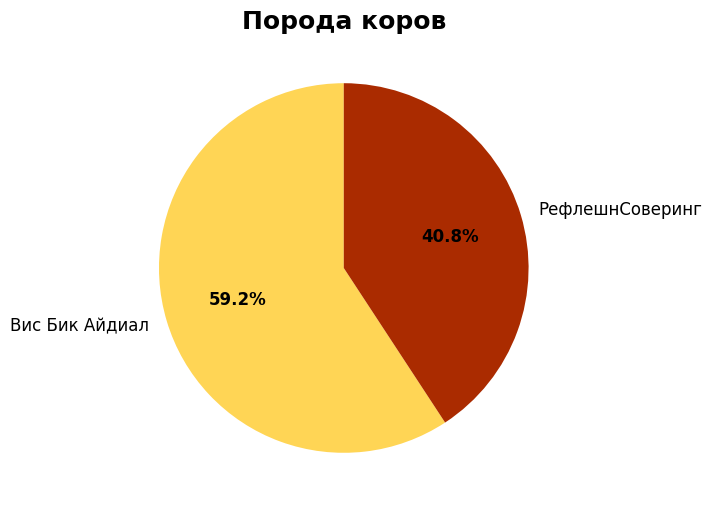

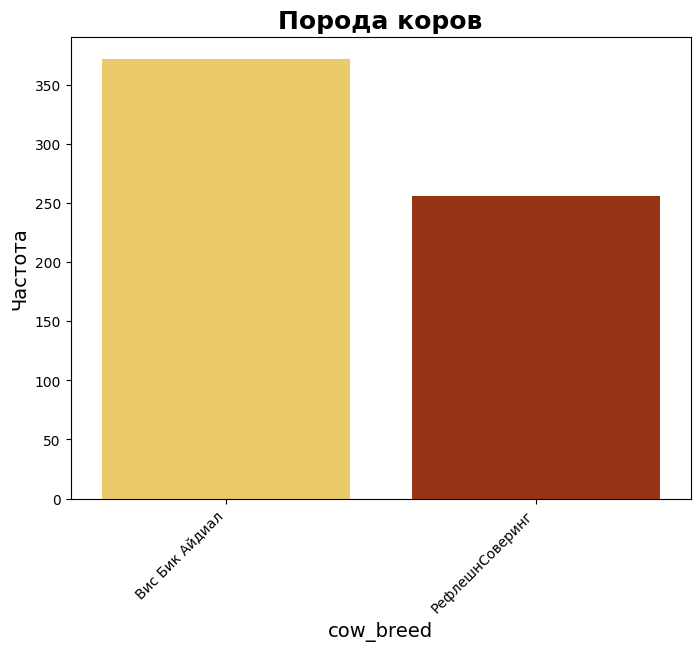

Вис Бик Айдиал     372
РефлешнСоверинг    256
Name: cow_breed, dtype: int64


In [19]:
categorical_attributes(main, 'cow_breed', 'Порода коров')

Коров с породой Вис Бик Айдиал в стаде фермера больше чем Рефлешн Соверинг. Вис Бик Айдиал  60%, РефлешнСоверинг 40%.

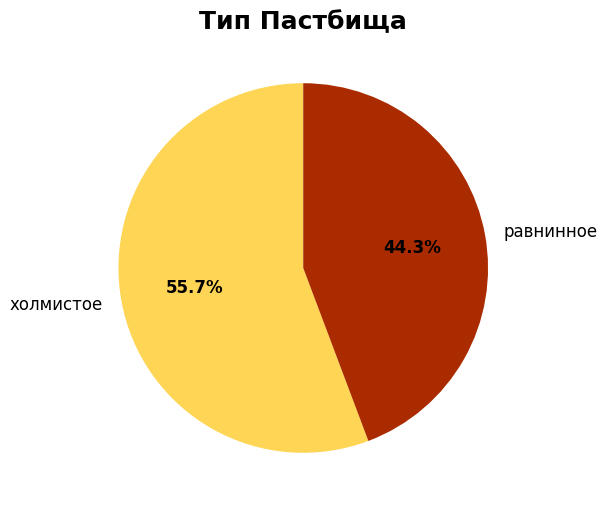

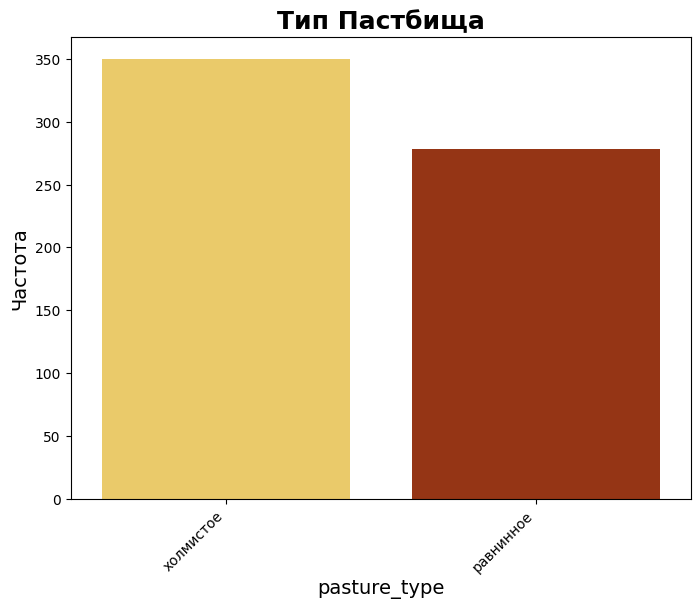

холмистое    350
равнинное    278
Name: pasture_type, dtype: int64


In [20]:
categorical_attributes(main, 'pasture_type', 'Тип Пастбища')

Большинство коров (55.7%) пасется на холмистом пастбище, оставшиеся на равнинном.

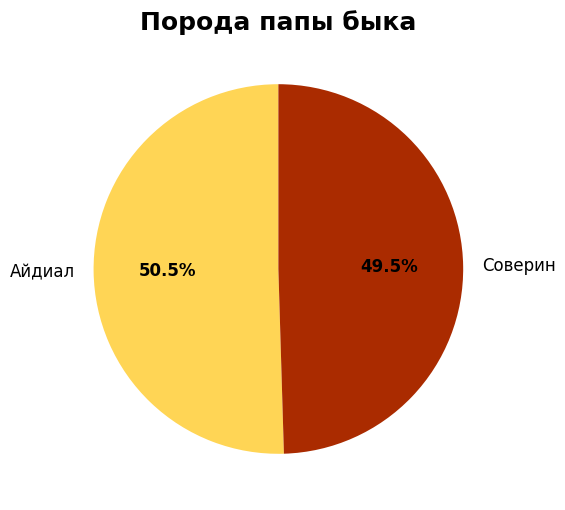

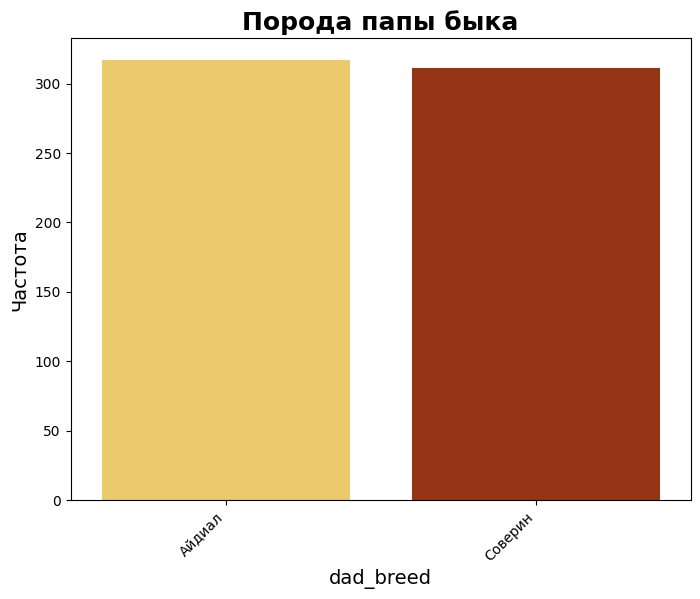

Айдиал     317
Соверин    311
Name: dad_breed, dtype: int64


In [21]:
categorical_attributes(main, 'dad_breed', 'Порода папы быка')

Породы пап-быков почти равномерно равны, 50,5% отцов породы Айдиал, остальные Соверин.

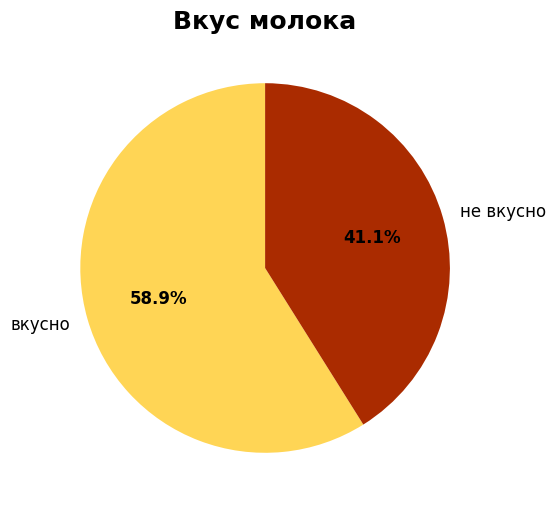

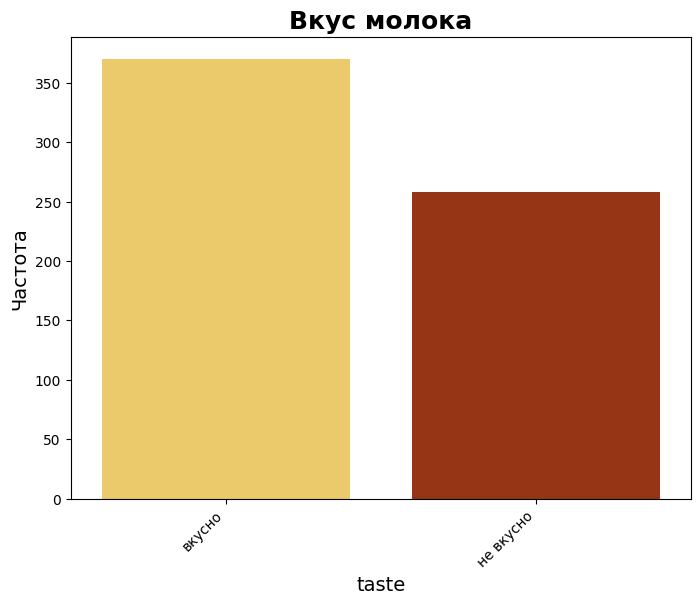

вкусно       370
не вкусно    258
Name: taste, dtype: int64


In [22]:
categorical_attributes(main, 'taste', 'Вкус молока')

Почти 59% молока фермер оценивает как вкусное.

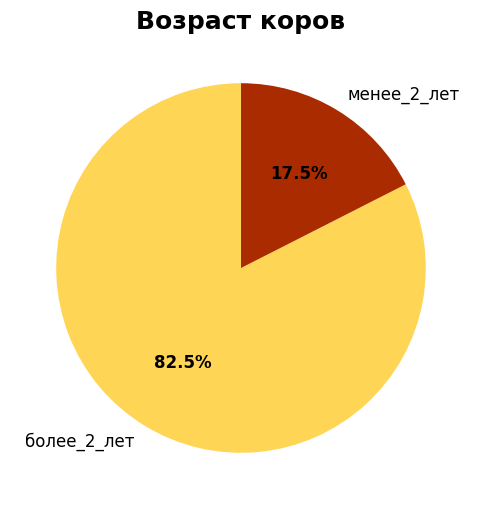

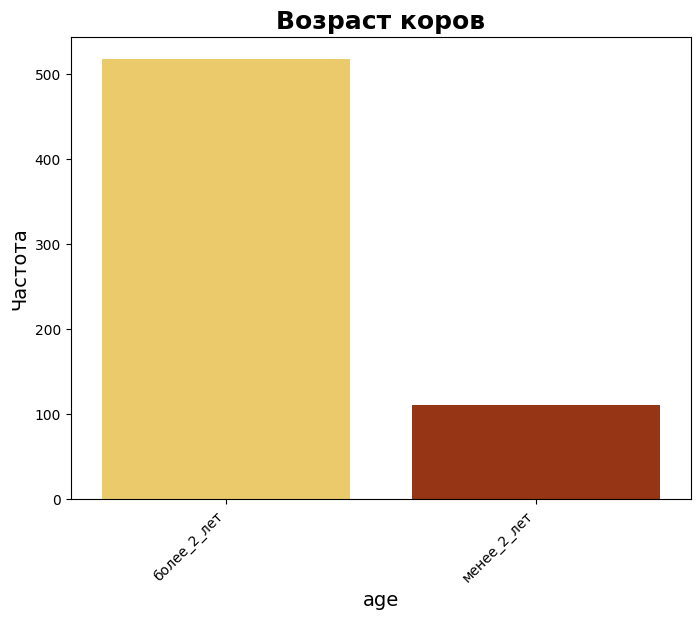

более_2_лет    518
менее_2_лет    110
Name: age, dtype: int64


In [23]:
categorical_attributes(main, 'age', 'Возраст коров')

82% стада старше 2 лет, молодняка в стаде фермере 18%.

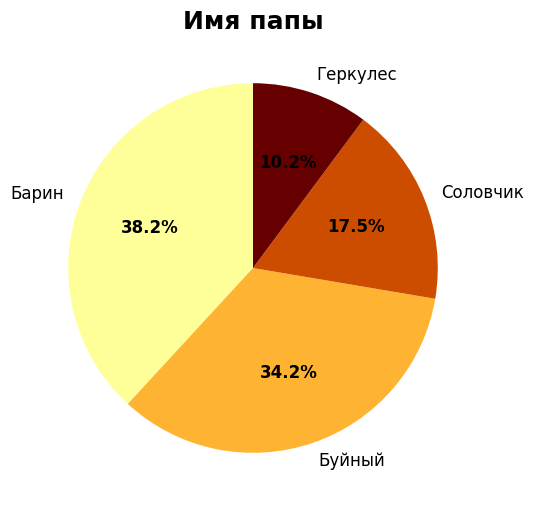

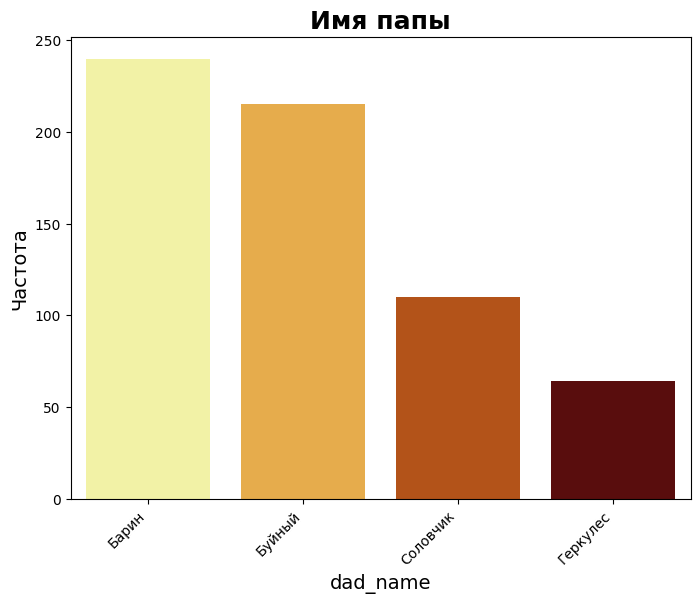

Барин       240
Буйный      215
Соловчик    110
Геркулес     64
Name: dad_name, dtype: int64


In [24]:
categorical_attributes(dad, 'dad_name', 'Имя папы')

Барин является папой 240 раз, это наивысший показатель, недалеко от него Буйный - 215 раз, меньше всего телок от Геркулеса - 64шт.

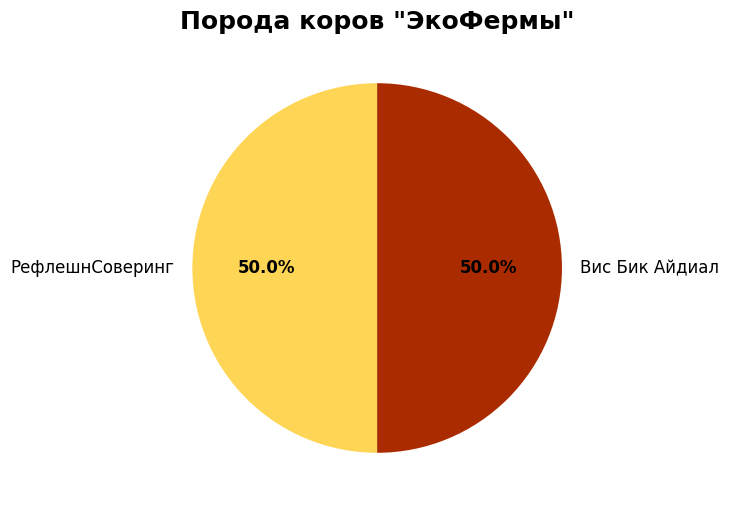

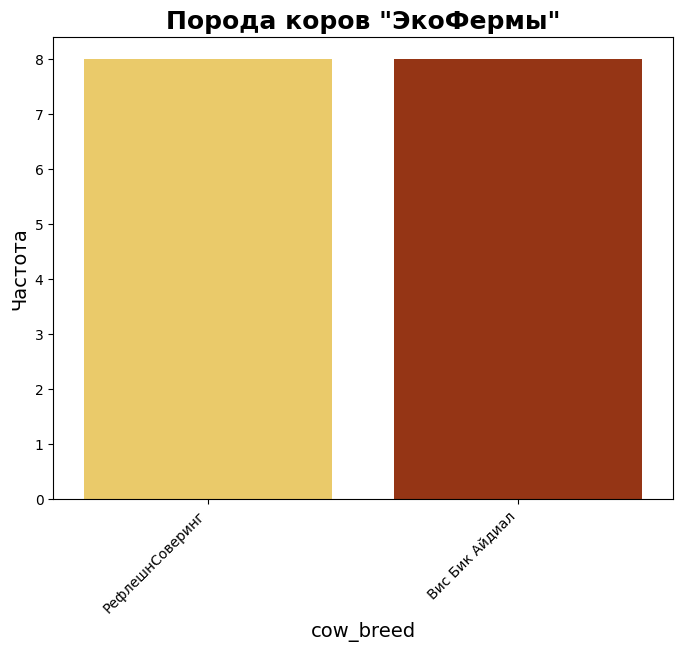

РефлешнСоверинг    8
Вис Бик Айдиал     8
Name: cow_breed, dtype: int64


In [25]:
categorical_attributes(cow, 'cow_breed', 'Порода коров "ЭкоФермы"')

Соотношение долей пород РефлешнСоверинг и Вис Бик Айдиал 50/50.

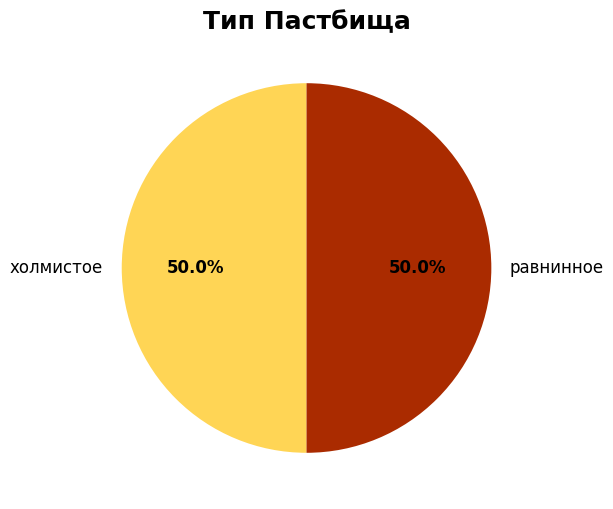

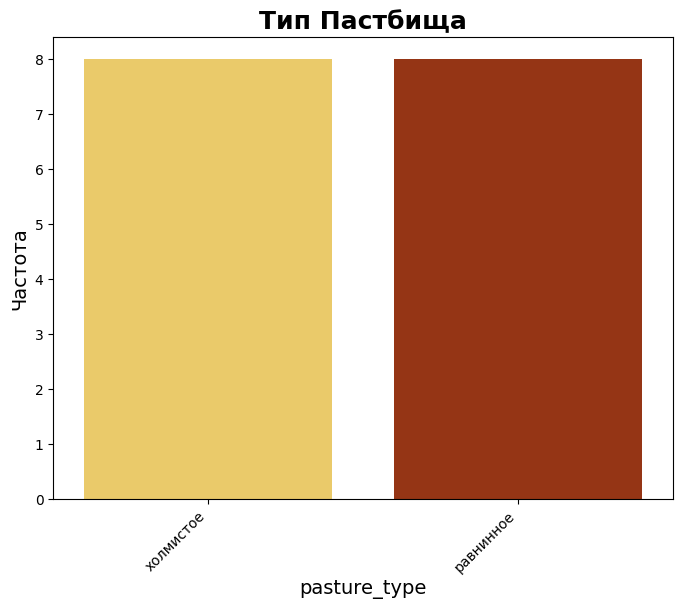

холмистое    8
равнинное    8
Name: pasture_type, dtype: int64


In [26]:
categorical_attributes(cow, 'pasture_type', 'Тип Пастбища')

Соотношение места пастьбы коров "ЭкоФермы" так же 50/50.

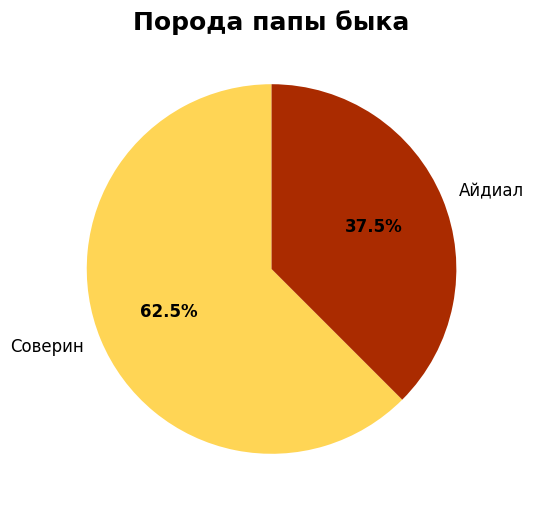

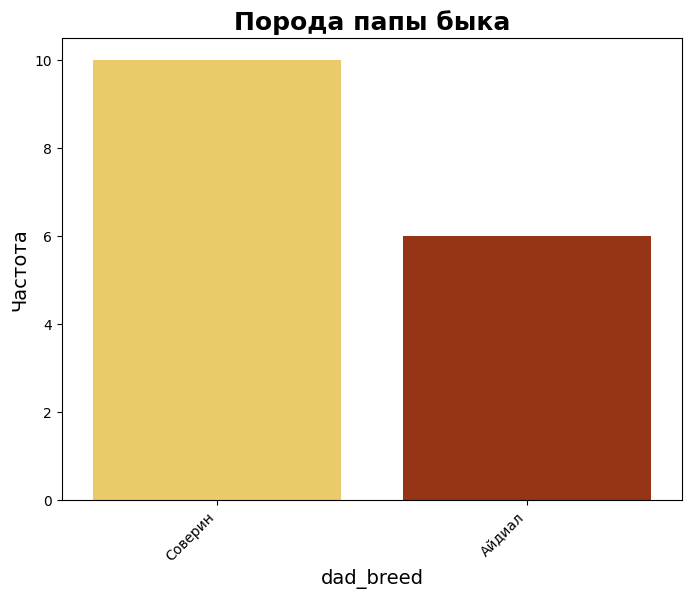

Соверин    10
Айдиал      6
Name: dad_breed, dtype: int64


In [27]:
categorical_attributes(cow, 'dad_breed', 'Порода папы быка')

В отличие от стада фермера в стаде "ЭкоФермы" преобладает порода отца Соверин.

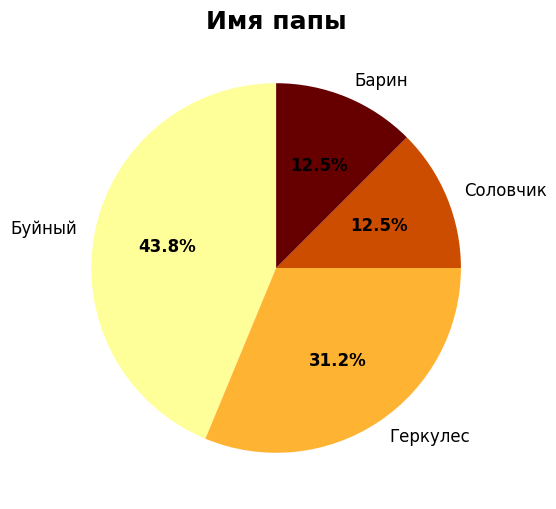

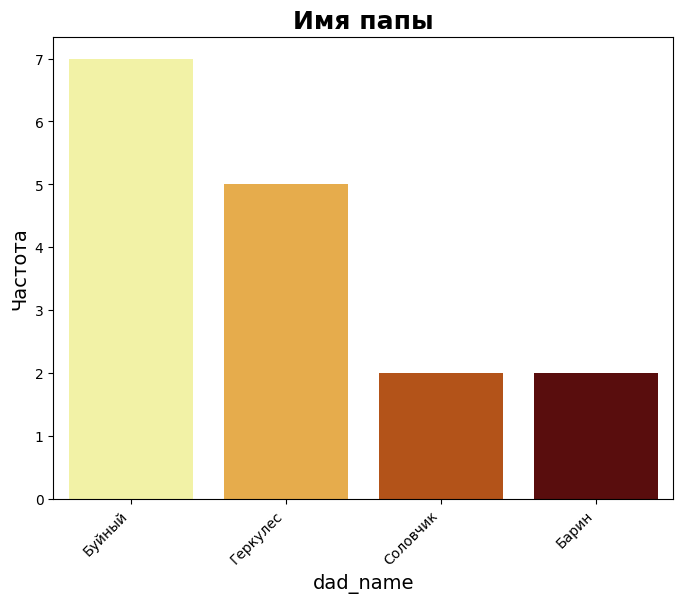

Буйный      7
Геркулес    5
Соловчик    2
Барин       2
Name: dad_name, dtype: int64


In [28]:
categorical_attributes(cow, 'dad_name', 'Имя папы')

Преобладающее количество телок от Буйного(7), наименьшее от Соловчика и Барина(2).

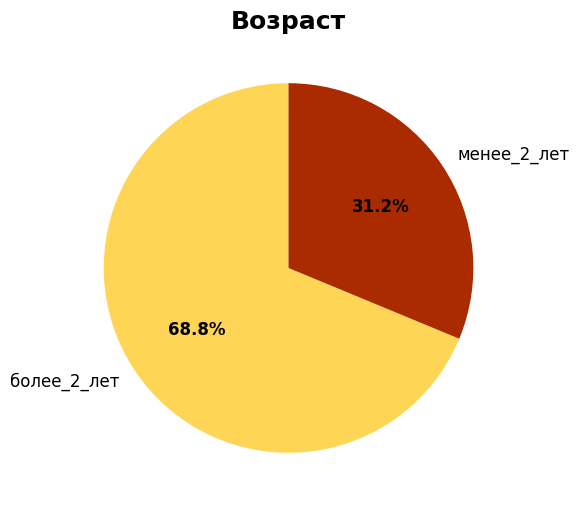

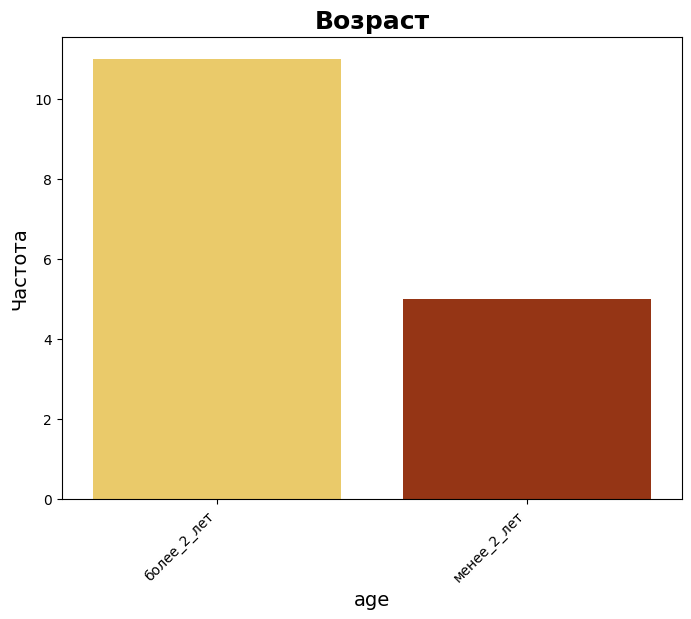

более_2_лет    11
менее_2_лет     5
Name: age, dtype: int64


In [29]:
categorical_attributes(cow, 'age', 'Возраст')

В стаде "Экофермы" преобладают зрелые телки (более 2-х лет).

**Количественные признаки**

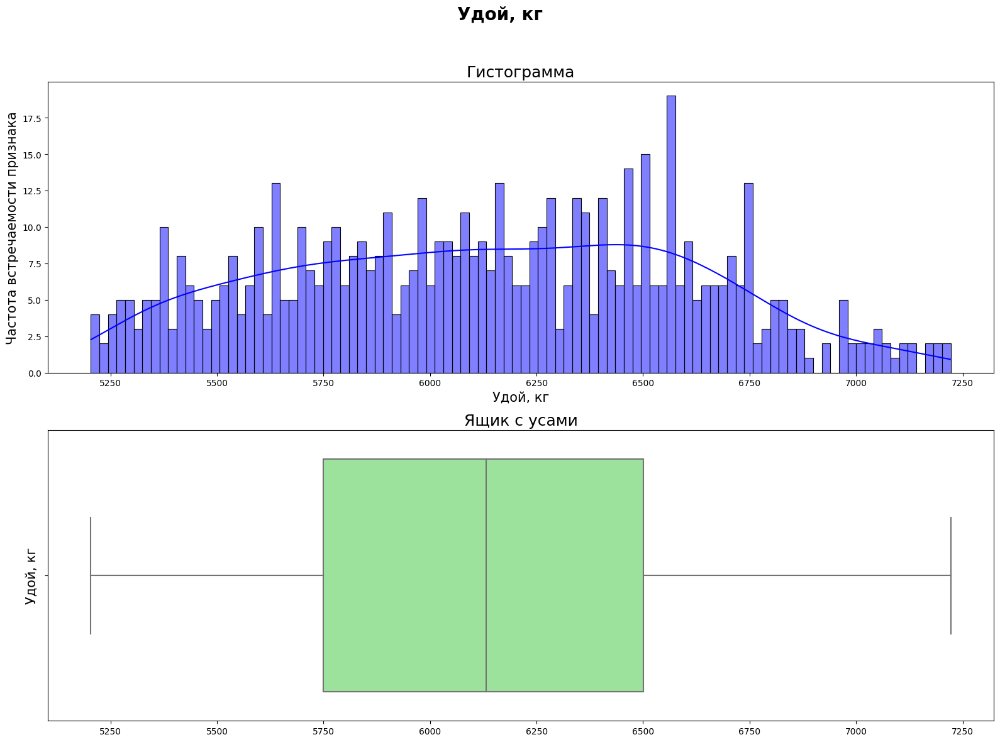

count     628.000
mean    6,125.968
std       475.857
min     5,204.000
25%     5,749.750
50%     6,132.500
75%     6,501.000
max     7,222.000
Name: yield_kg, dtype: float64


In [30]:
quantitative_attributes(main,'yield_kg','Удой, кг', bins=100)

Максимальный удой в стаде фермера за год составляет 7222 кг молока, в то время как минимальное значение равняется 5204 кг. Медиана, равная 6132 кг, практически совпадает со средним значением, составляющим 6125 кг, с разницей всего лишь 7 кг. На гистограмме распределение значений выглядит довольно равномерно, без выраженных пиков, за исключением того, что удои превышающие 6750 кг встречаются реже, чем значения ниже этого порога. Результаты, представленные у ящика с усами, подтверждают наблюдения.

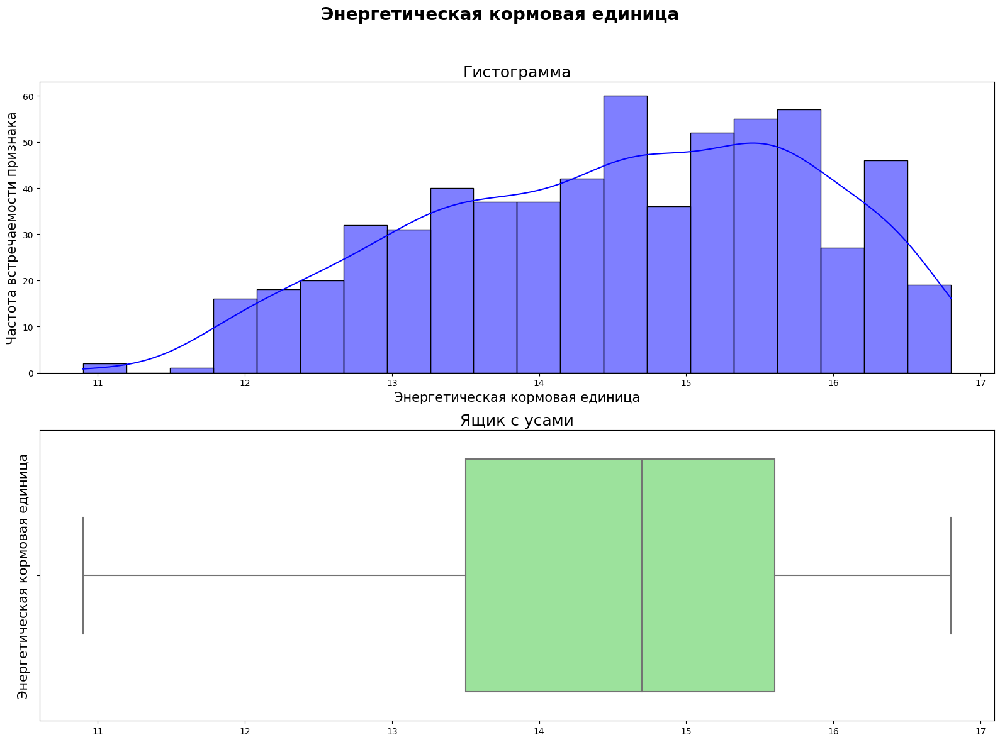

count   628.000
mean     14.549
std       1.302
min      10.900
25%      13.500
50%      14.700
75%      15.600
max      16.800
Name: eke, dtype: float64


In [31]:
quantitative_attributes(main,'eke','Энергетическая кормовая единица', bins=20)

Максимальный показатель питательности корма составляет 16.80 единиц, минимальный 10.90 единиц. Среднее значение меньше медианы на 0.15 единиц и составляет 14.55, а медиана 14.70 ед.. Значения параметра распределены почти равномерно за исключением минимальных показателей питательности кормов от 10.90 до 11.60 единиц.

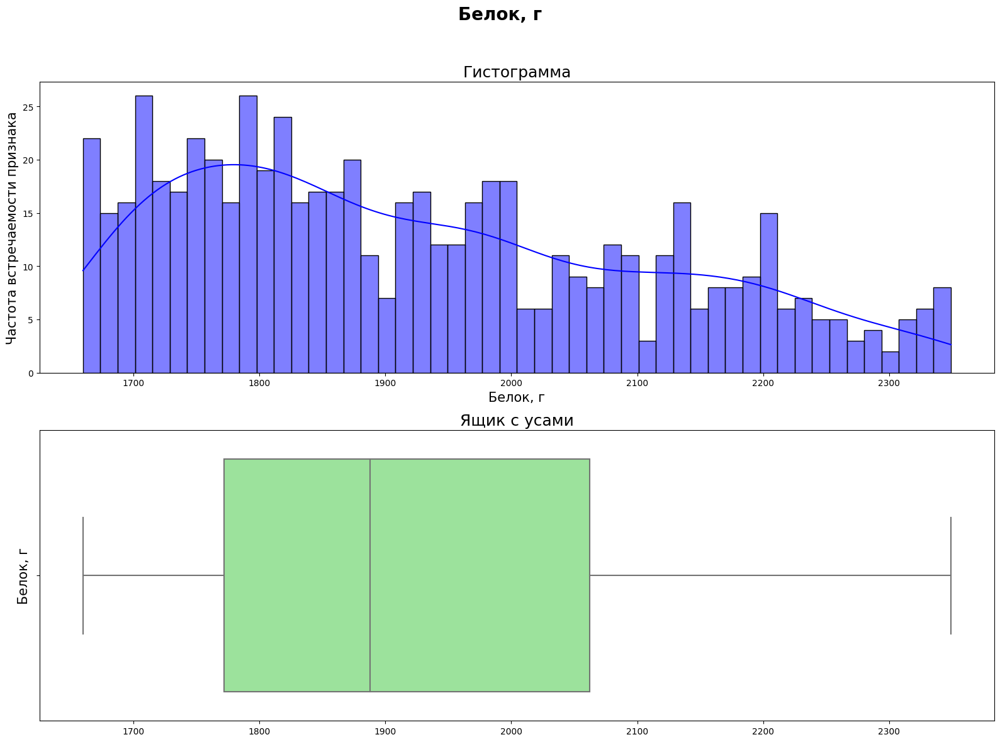

count     628.000
mean    1,923.760
std       182.833
min     1,660.000
25%     1,771.750
50%     1,888.000
75%     2,062.250
max     2,349.000
Name: protein_g, dtype: float64


In [32]:
quantitative_attributes(main,'protein_g','Белок, г', bins=50)

Максимальное количество белка в молоке 2349 г, минимальное 1660. Среднее значение немного выше, чем медиана и равно 1923,8 г. Медиана равна 1888 г. Значения распределены равномерно от 1660 до 1890 г, далее едет медленное уменьшение частоты значений.

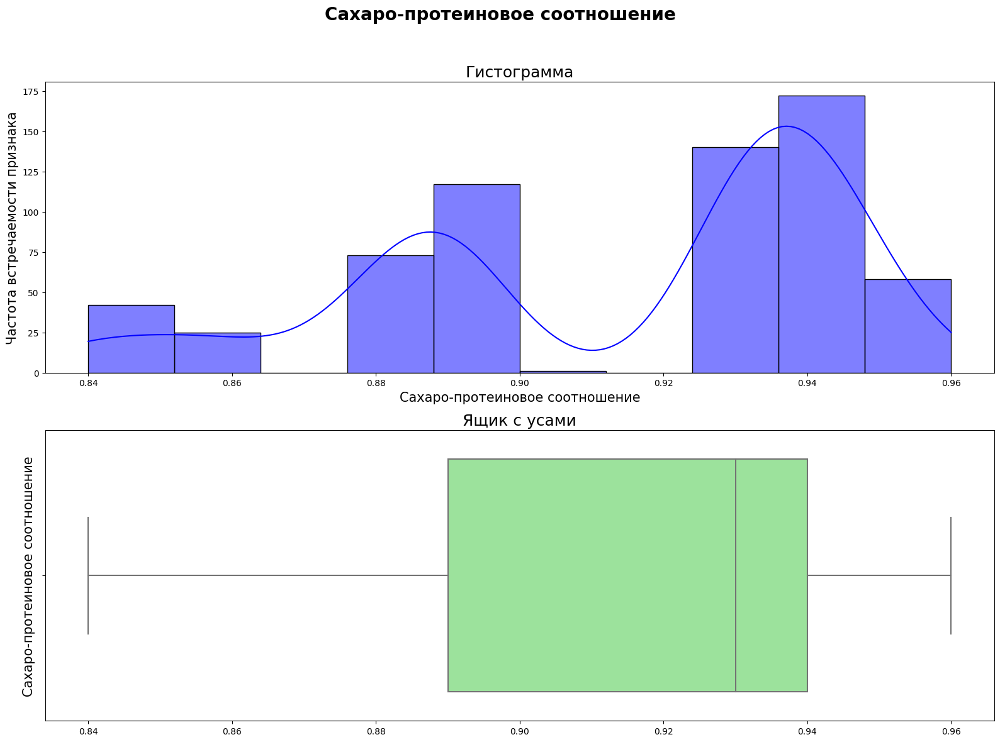

count   628.000
mean      0.913
std       0.032
min       0.840
25%       0.890
50%       0.930
75%       0.940
max       0.960
Name: spo, dtype: float64


In [33]:
quantitative_attributes(main,'spo','Сахаро-протеиновое соотношение', bins=10)

Минимальное значение СПО равно 0.840, максимальное 0.960. Среднее значение 0.913. Выбросы не обнаружены.

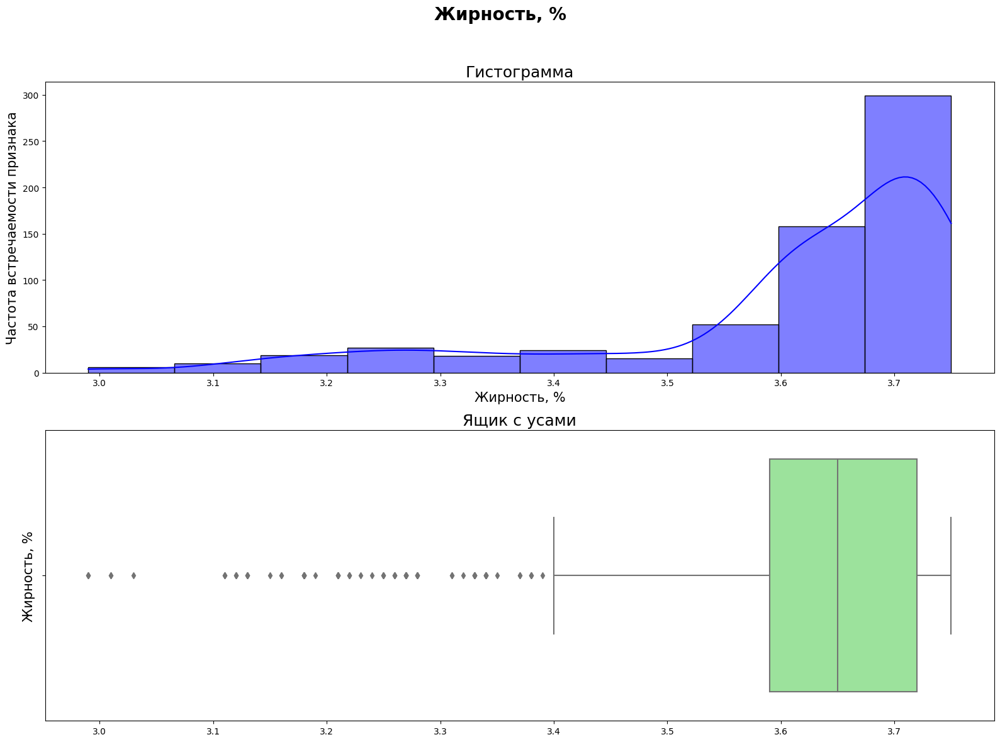

count   628.000
mean      3.604
std       0.168
min       2.990
25%       3.590
50%       3.650
75%       3.720
max       3.750
Name: fat_share, dtype: float64


In [34]:
quantitative_attributes(main,'fat_share','Жирность, %', bins=10)

Ящик с усами указывает на большое количество выбросов в промежутке значений от 2.99% до 3.4 %. Логично не считать это выбросы за выбросы, в молоке 3% жирности нет ничего аномального. Основной массив данных расаполагается в промежутке значений от 3.4% до 3,75%, медиана равна 3,65%, а среднее 3,6%. Большинство данных расположено в узком промежутке высоких значений, поэтому гистограмма скошена влево.

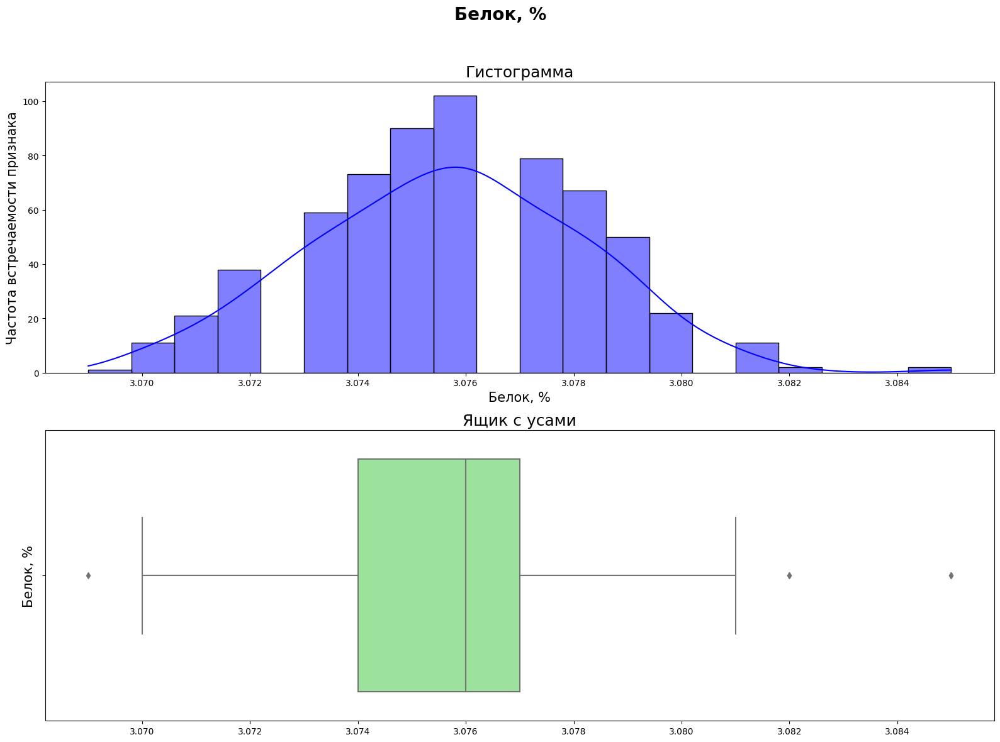

count   628.000
mean      3.076
std       0.003
min       3.069
25%       3.074
50%       3.076
75%       3.077
max       3.085
Name: protein_share, dtype: float64


In [35]:
quantitative_attributes(main,'protein_share','Белок, %', bins=20)

Проверим как много значений относятся к выбросам.

In [36]:
main.query('3.081 < protein_share > 3.070')

,index,id,yield_kg,eke,protein_g,spo,cow_breed,pasture_type,dad_breed,fat_share,protein_share,taste,age
76,77,78,5871,14.700,1795,0.895,Вис Бик Айдиал,равнинное,Айдиал,3.610,3.082,вкусно,более_2_лет
425,426,427,6701,15.700,2068,0.940,РефлешнСоверинг,холмистое,Айдиал,3.720,3.082,вкусно,более_2_лет
470,471,472,5883,14.900,2159,0.890,Вис Бик Айдиал,равнинное,Соверин,3.620,3.085,вкусно,более_2_лет
516,517,518,5819,13.700,1968,0.840,Вис Бик Айдиал,холмистое,Айдиал,3.150,3.085,вкусно,более_2_лет


Удалять эти строки не вижу смысла, выбросов мало и они несущественные. Можно сделать вывод, что данные распределены почти нормально, средний процент содержания белка в молоке равно медиане и составляет 3.076.

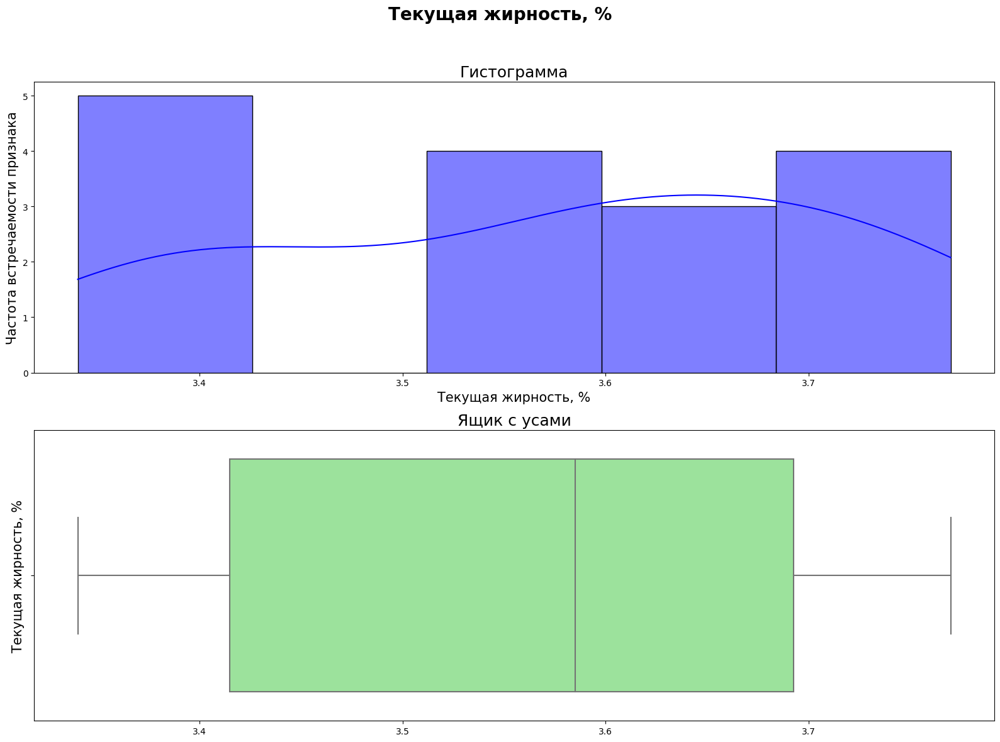

count   16.000
mean     3.572
std      0.142
min      3.340
25%      3.415
50%      3.585
75%      3.692
max      3.770
Name: fat_share, dtype: float64


In [37]:
quantitative_attributes(cow,'fat_share','Текущая жирность, %', bins=5)

Текущая жирность распределена от 3.3% до 3.7%, среднее значение и медиана почти одинаковые 3.57, 3.58 соответственно.

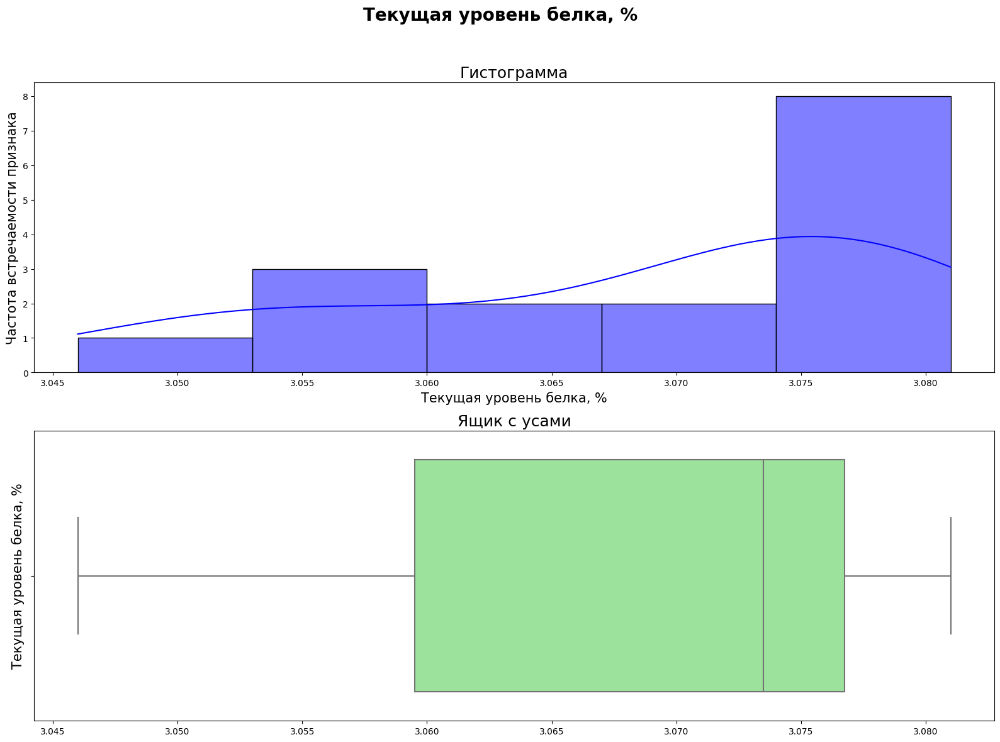

count   16.000
mean     3.068
std      0.011
min      3.046
25%      3.059
50%      3.074
75%      3.077
max      3.081
Name: protein_share, dtype: float64


In [38]:
quantitative_attributes(cow,'protein_share','Текущая уровень белка, %', bins=5)

Текущий уровень белка от 3.04 до 3.08, среднее равно 3.06, медиана 3.07. Половина значений является максимальными, поэтому гистограмма скошена влево.

#### 3.2. Промежуточный вывод

**Цель:** провести исследовательский анализ данных.  
**Задачи:**
1. Провести статистический анализ данных.
2. Построить графики для каждого признака.

**Результаты**

1) Провести статистический анализ данных: 
- Имеются выбросы в количественных столбцах `fat_share`,`protein_share` датафрейма с информацией о коровах фермера. Данные выбросы не подверглись удалению, так как их отклонение от основной группы данных несущественно и малочисленно.
- Среднее и медиана у всех количественных признаков слабо отличались друг от друга.

2) Построить графики для каждого признака:
- Создано две функции: `quality_attributes` для категориальных признаков и `quantitative_data` для количественных признаков.
- По графикам видно, что количественные данные распределены ненормально, скорее всего из-за специфики данных.
- Данные полные, корректные, улучшения не требуются.

# Шаг 4

#### 4.1. Выявление корреляции

Рассчитаем коэффициент корреляции Фи между всеми признаками в датафреймах `main`.

interval columns not set, guessing: ['index', 'yield_kg', 'eke', 'protein_g', 'spo', 'fat_share', 'protein_share']


,index,yield_kg,eke,protein_g,spo,cow_breed,pasture_type,dad_breed,fat_share,protein_share,taste,age
index,1.000,0.000,0.000,0.116,0.382,0.612,0.038,0.321,0.520,0.000,0.040,0.000
yield_kg,0.000,1.000,0.721,0.463,0.661,0.165,0.280,0.520,0.708,0.059,0.173,0.998
eke,0.000,0.721,1.000,0.456,0.591,0.123,0.107,0.171,0.716,0.000,0.272,0.772
protein_g,0.116,0.463,0.456,1.000,0.387,0.091,0.096,0.000,0.397,0.202,0.176,0.352
spo,0.382,0.661,0.591,0.387,1.000,0.063,0.155,0.426,0.646,0.074,0.573,0.744
cow_breed,0.612,0.165,0.123,0.091,0.063,1.000,0.213,0.089,0.223,0.362,0.000,0.057
pasture_type,0.038,0.280,0.107,0.096,0.155,0.213,1.000,0.000,0.000,0.100,0.269,0.128
dad_breed,0.321,0.520,0.171,0.000,0.426,0.089,0.000,1.000,0.000,0.135,0.000,0.356
fat_share,0.520,0.708,0.716,0.397,0.646,0.223,0.000,0.000,1.000,0.000,0.199,0.678
protein_share,0.000,0.059,0.000,0.202,0.074,0.362,0.100,0.135,0.000,1.000,0.144,0.000


None


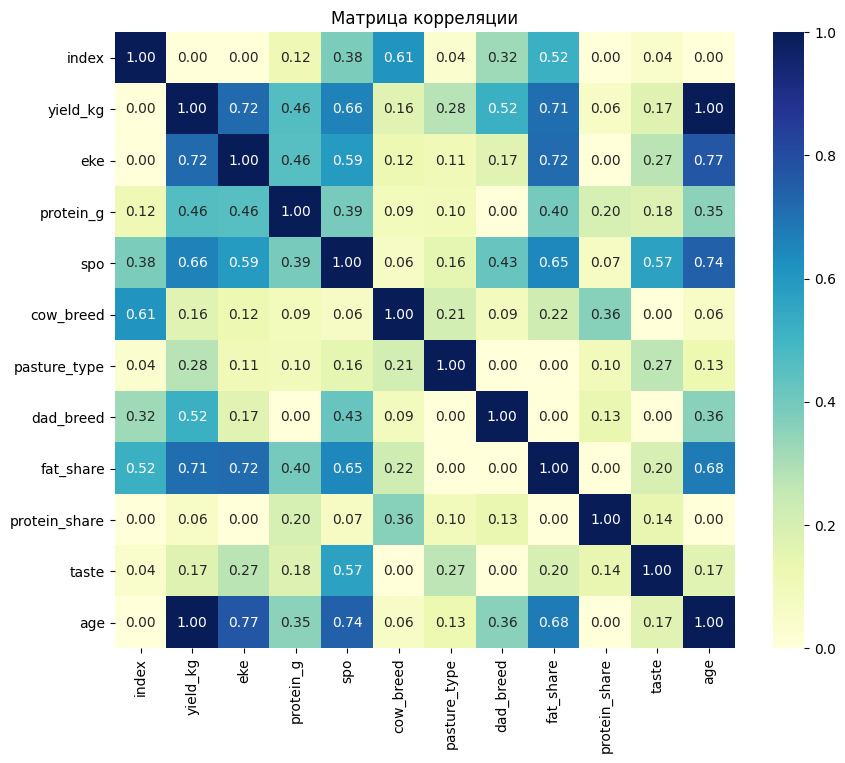

In [39]:
corr_main = main.drop('id', axis=1)
correlation_matrix = corr_main.phik_matrix() 
print(display(correlation_matrix))

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='YlGnBu')
plt.title('Матрица корреляции')
plt.show()

Видна сильная положительная зависимость между удоем и возрастом коровы, жирностью, ЭКЕ. Умеренная зависимость между удоем и породой отца, свобоным протеином. Слабая зависимость между удоем и типом пастбища.

#### 4.2. Диаграммы рассеяния

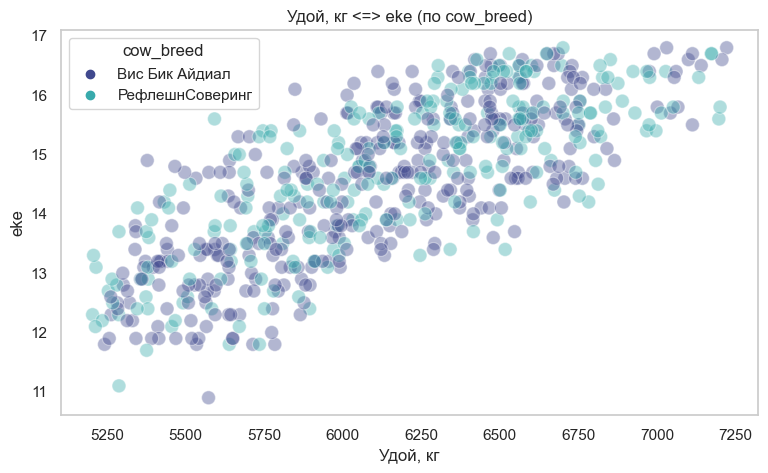

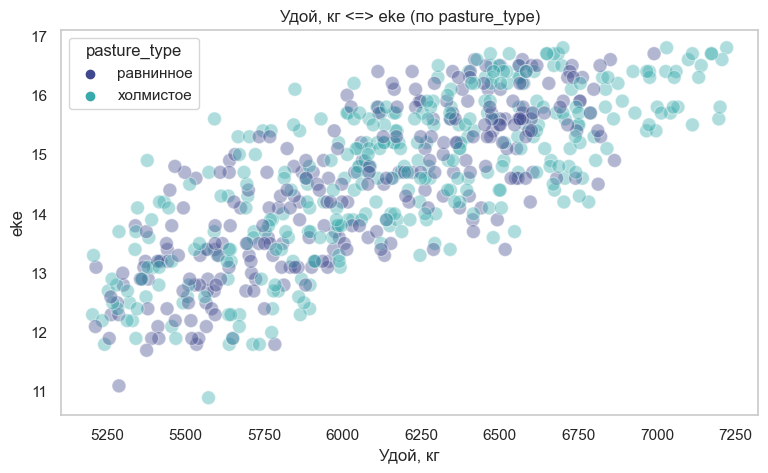

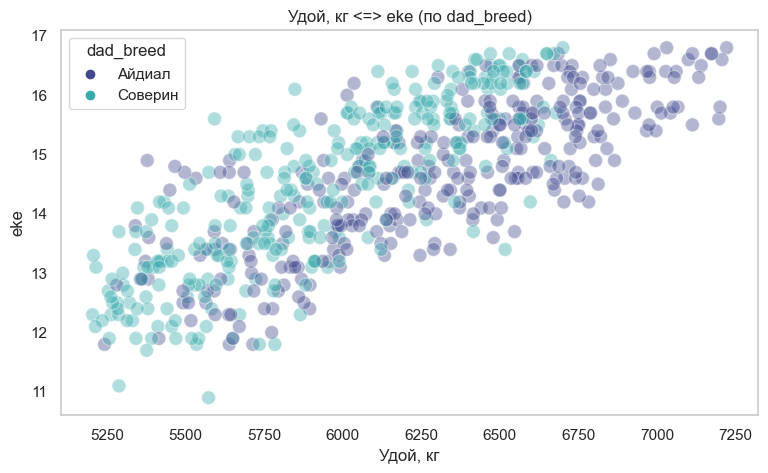

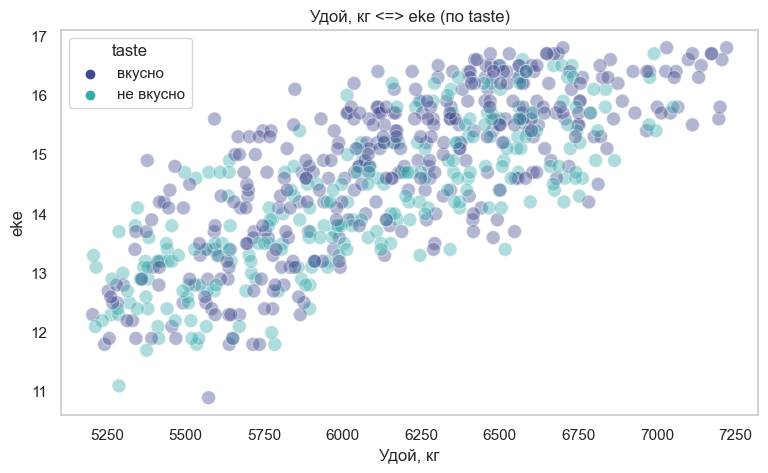

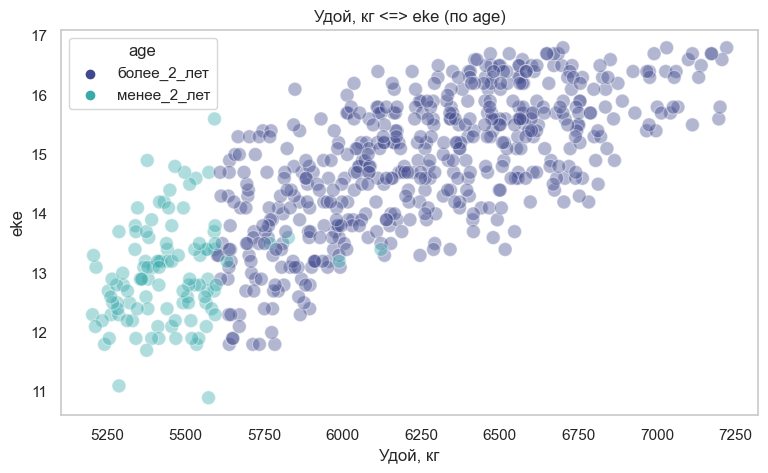

...

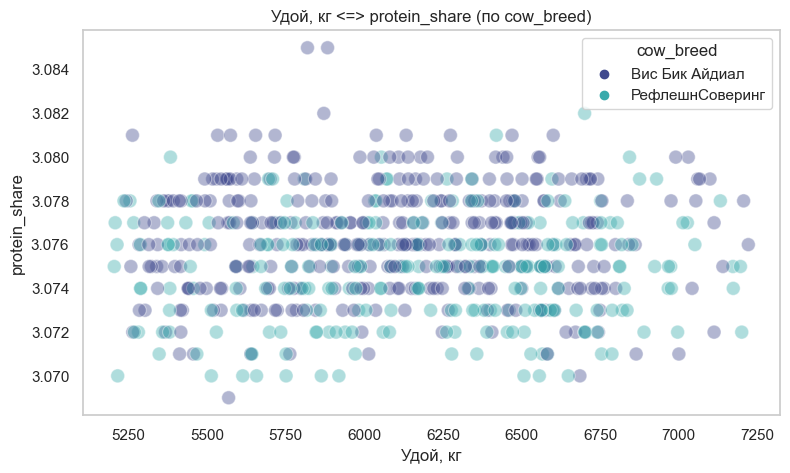

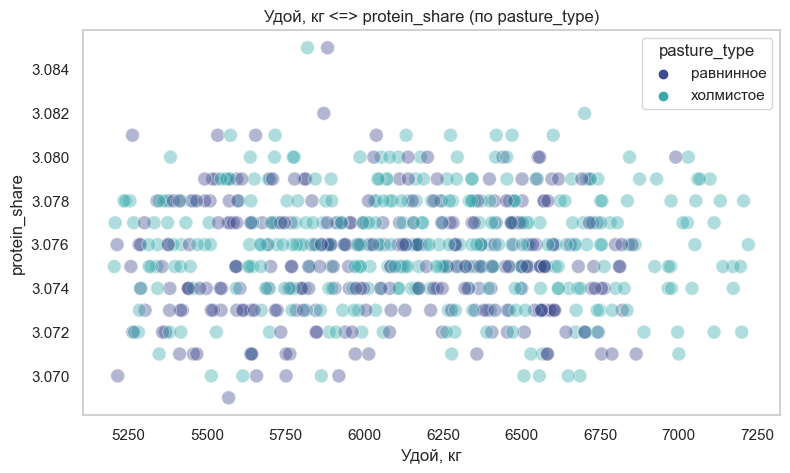

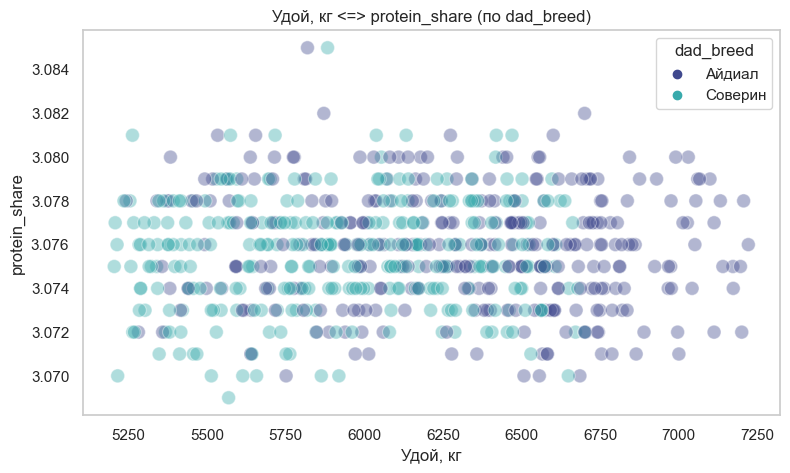

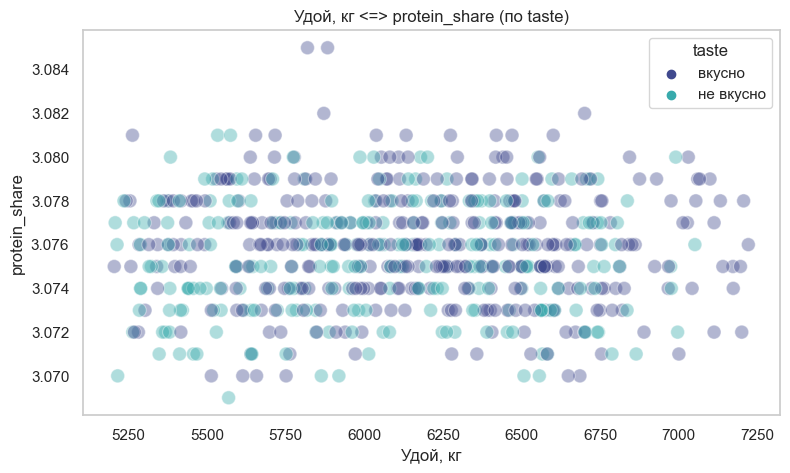

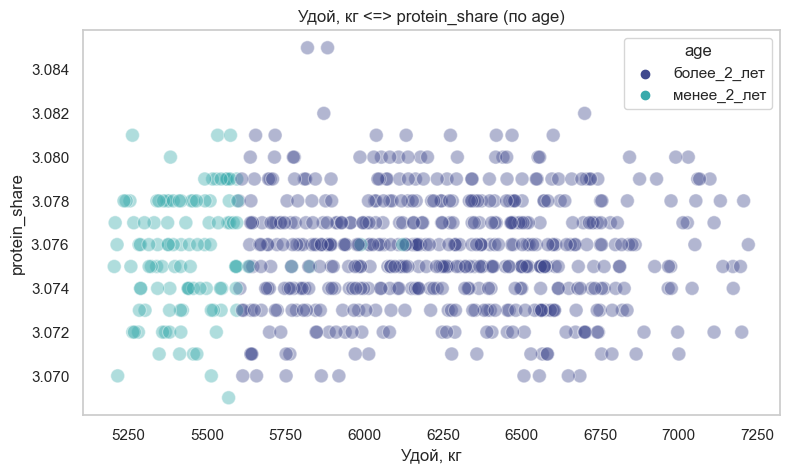

In [40]:
quantitative_attributes = ['eke', 'protein_g', 'spo', 'fat_share', 'protein_share']
categorical_attributes = ['cow_breed', 'pasture_type', 'dad_breed', 'taste', 'age']

sns.set(style="whitegrid")

for attribute in quantitative_attributes:
    for cat_attribute in categorical_attributes:
        plt.figure(figsize=(9, 5))

        # Построение графика
        sns.scatterplot(data=corr_main,
                         x='yield_kg',   
                         y=attribute,      
                         hue=cat_attribute, 
                         palette='mako',
                         alpha=0.4,
                         s=100)

        # Настройка графика
        plt.title(f'Удой, кг <=> {attribute} (по {cat_attribute})')
        plt.xlabel('Удой, кг')
        plt.ylabel(attribute)
        plt.legend(title=cat_attribute)
        plt.grid()
        plt.show()

Посмотрим поближе на значения сахаро-протеинового отношения `spo`.

In [41]:
corr_main['spo'].unique()

array([0.89 , 0.885, 0.93 , 0.94 , 0.895, 0.95 , 0.96 , 0.85 , 0.84 ,
       0.86 , 0.88 , 0.9  ])

* Тип взаимосвязи между целевым (Удой,кг) и входными признаками является линейным, кроме `spo`, `protein_share`.
* Так же смущает вид диаграммы рассеяния у признака `spo / СПО`, признаки распределились как бинарные, думаю стоит перевести признак в категориальный, так как в нем всего 12 возможных значений.
* Явление мультиколлинеарности в данных не наблюдается.

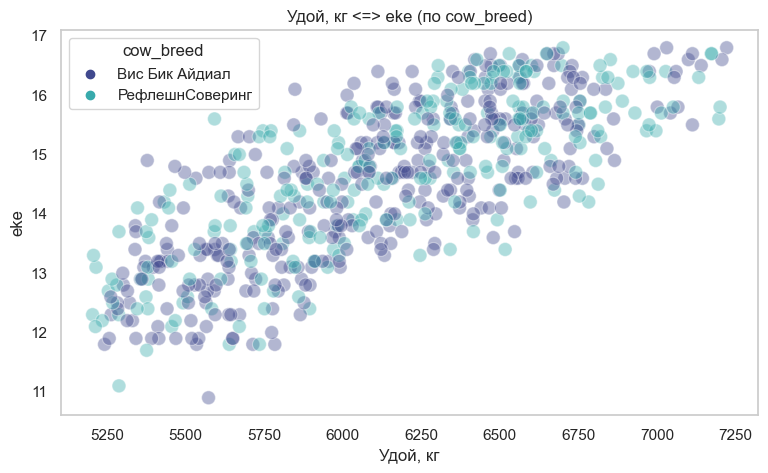

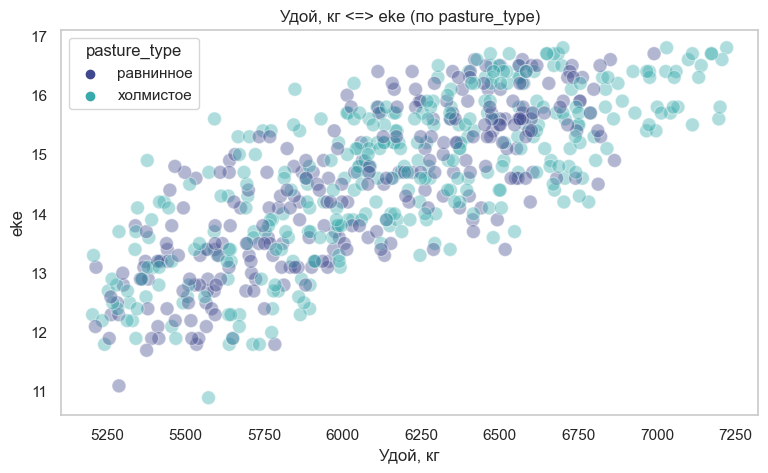

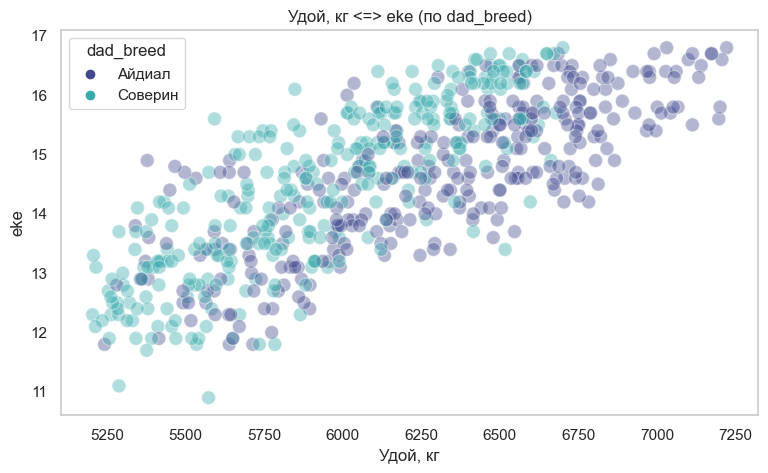

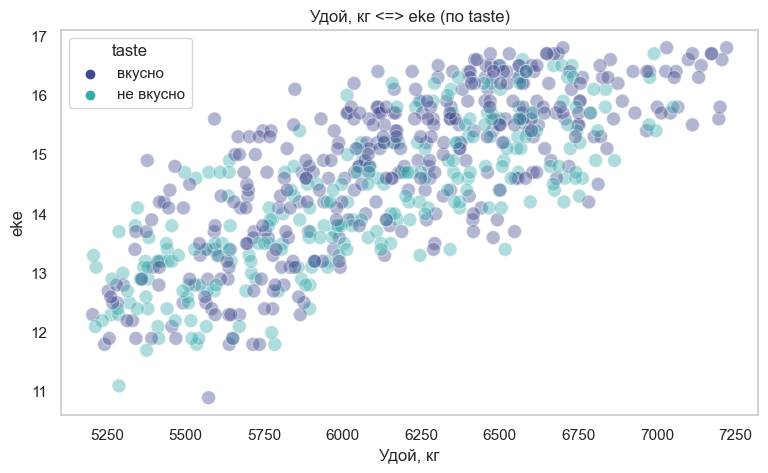

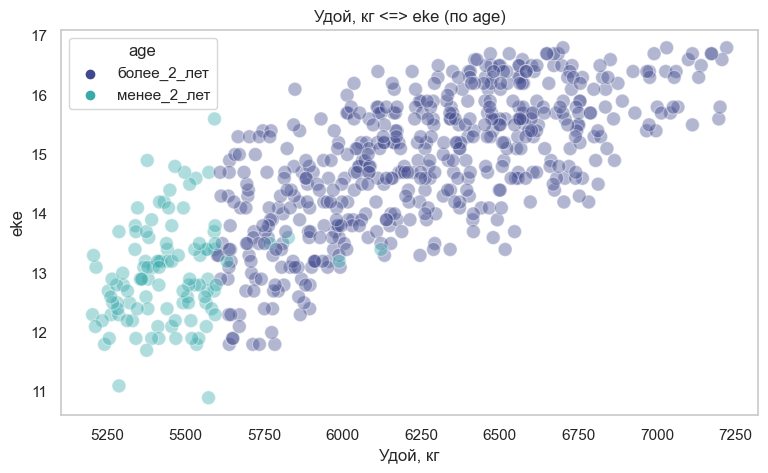

...

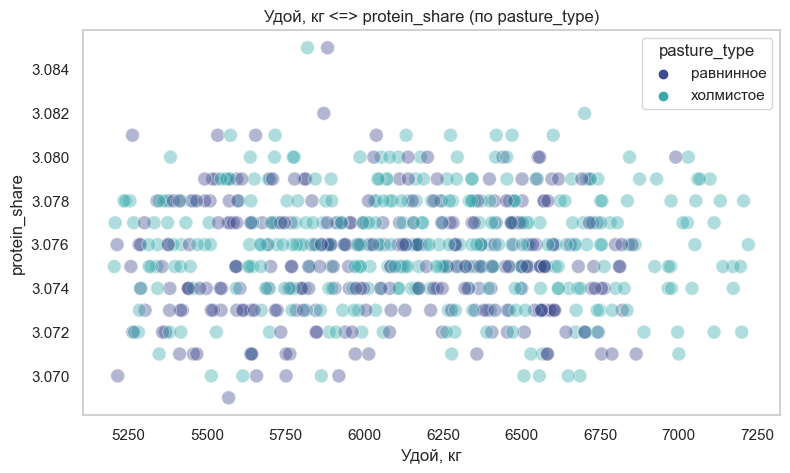

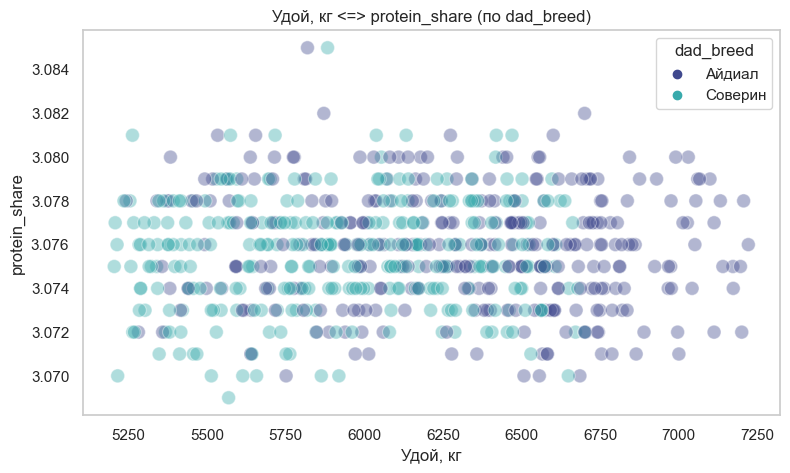

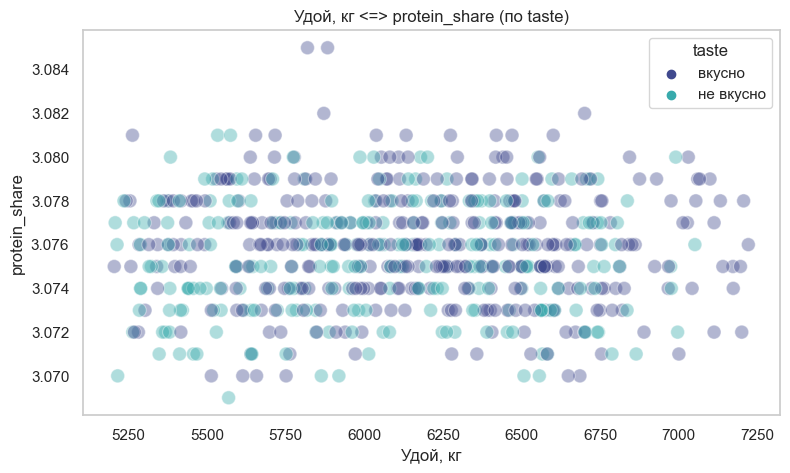

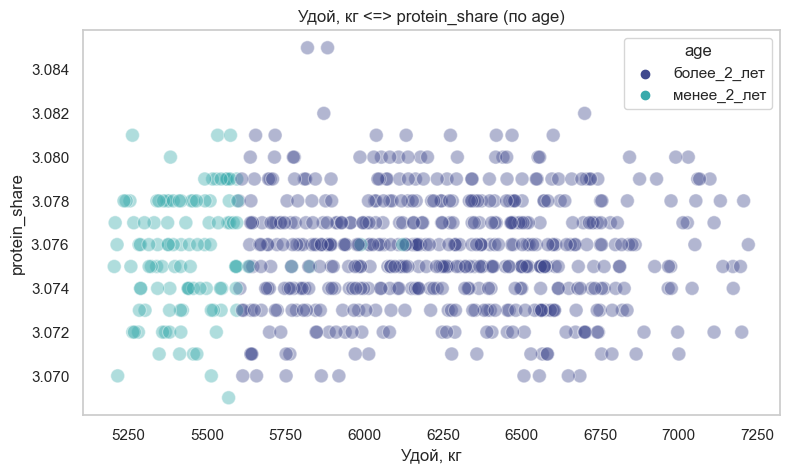

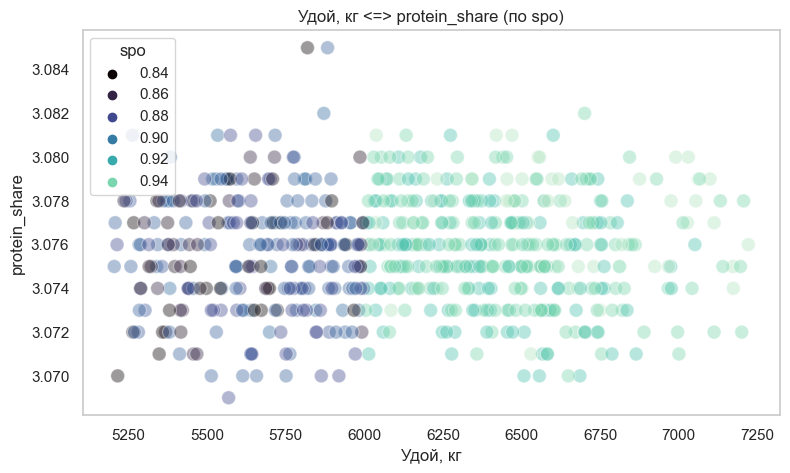

In [42]:
quantitative_attributes = ['eke', 'protein_g', 'fat_share', 'protein_share']
categorical_attributes = ['cow_breed', 'pasture_type', 'dad_breed', 'taste', 'age','spo']

sns.set(style="whitegrid")

for attribute in quantitative_attributes:
    for cat_attribute in categorical_attributes:
        plt.figure(figsize=(9, 5))

        # Построение графика
        sns.scatterplot(data=corr_main,
                         x='yield_kg',   
                         y=attribute,      
                         hue=cat_attribute, 
                         palette='mako',
                         alpha=0.4,
                         s=100)

        # Настройка графика
        plt.title(f'Удой, кг <=> {attribute} (по {cat_attribute})')
        plt.xlabel('Удой, кг')
        plt.ylabel(attribute)
        plt.legend(title=cat_attribute)
        plt.grid()
        plt.show()

`spo` действительно показывает себя лучше как категориальный признак. Тип взаимосвязи с целевым признаком все таки линейный.

## Промежуточный вывод

**Цель:** провести корреляционный анализ признаков.  
**Задачи:**
1. Выявить корреляцию.
2. Построить диаграммы рассеяния для всех колличественных и качественных признаков.

**Результаты**

1) Выявить корреляцию: 
- Для расчета корреляции применялся коэффициент Фи так как среди признаков имелись категориальные. Выявлена сильная положительная зависимость между удоем и возрастом коровы, жирностью, ЭКЕ.

2) Построить диаграммы рассеяния для всех колличественных и качественных признаков:
- Взаимосвязь между удоем и большинством признаков линейная; исключения — `spo` и `protein_share`.
- `spo` переведено к категориальным признакам для образования линейности.
- Мультиколлинеарность отсутсвует.

#### 4.3. Промежуточный вывод

**Цель:** провести корреляционный анализ признаков.  
**Задачи:**
1. Выявить корреляцию.
2. Построить диаграммы рассеяния для всех колличественных и качественных признаков.

**Результаты**

1) Выявить корреляцию: 
- Для расчета корреляции применялся коэффициент Фи так как среди признаков имелись категориальные. Выявлена сильная положительная зависимость между удоем и возрастом коровы, жирностью, ЭКЕ.

2) Построить диаграммы рассеяния для всех колличественных и качественных признаков:
- Взаимосвязь между удоем и большинством признаков линейная; исключения — `spo` и `protein_share`.
- `spo` переведено к категориальным признакам для образования линейности.
- Мультиколлинеарность отсутсвует.

# Шаг 5

#### 5.1. Первая модель линейной регрессии

Подготовим датафрейм `main` к обучению первой модели. Целевой признак `yield_kg / удой,кг` входными признаками будет все за исключением `id`, `protein_share`, `taste` и `fat_share`. Данные признаки не влияют на удой, так как являются характеристиками уже полученного молока, а вот кормление и наследственность влияют на удой.

In [43]:
main_lm = main.copy()
main_lm = main_lm.drop(['id', 'protein_share', 'fat_share','taste'], axis=1)
main_lm.head(1)

,index,yield_kg,eke,protein_g,spo,cow_breed,pasture_type,dad_breed,age
0,0,5863,14.200,1743,0.890,Вис Бик Айдиал,равнинное,Айдиал,более_2_лет


In [44]:
X = main_lm.drop('yield_kg', axis=1)
y = main_lm['yield_kg']
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size =0.25,
    random_state = RANDOM_STATE
)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(471, 8)
(157, 8)
(471,)
(157,)


Для дальнейшей работы нужно масштабировать данные, используем стандартизацию для количественных признаков и кодирование для категориальных признаков.

In [45]:
# Стандартизация
num_col_names = ['eke', 'protein_g', 'spo']
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train[num_col_names])
X_test_scaled = scaler.transform(X_test[num_col_names])

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_col_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_col_names)

# Кодирование
cat_col_names = ['cow_breed', 'pasture_type', 'dad_breed', 'age']
encoder = OneHotEncoder(drop='first', sparse=False)
X_train_ohe = encoder.fit_transform(X_train[cat_col_names])
X_test_ohe = encoder.transform(X_test[cat_col_names])

encoder_col_names = encoder.get_feature_names(cat_col_names) 
X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

# Обучаем модель
model_lr_1= LinearRegression()
model_lr_1.fit(X_train, y_train)
prediction = model_lr_1.predict(X_test)

# Коэффициент детерминации
r2 = r2_score(
    y_test,
    prediction
)
print("Коэффициент детерминации R^2:", r2)

Коэффициент детерминации R^2: 0.7844078173416968


Коэффициент детерминации равный 0.784 это достаточно хороший показатель, означающий, что модель хорошо подстраивается под данные, хотя есть еще 21.56% вариаций, которые не объясняются данной моделью. Проанализируем ошибки, для этого построим график остатков.

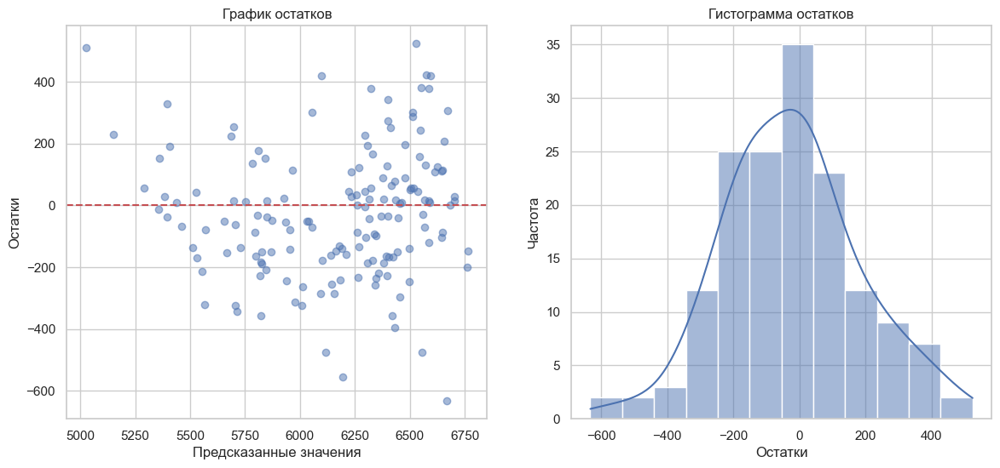

In [46]:
residuals = y_test - prediction
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.scatter(prediction, residuals, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('График остатков')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.grid(True)

# Гистограмма остатков
plt.subplot(1, 2, 2)
sns.histplot(residuals, kde=True)
plt.title('Гистограмма остатков')
plt.xlabel('Остатки')
plt.ylabel('Частота')
plt.grid(True)

plt.show()

Остатки имеют распределение близкое к нормальному, правый хвост толще левого, это свидетельстует о том, что модель немного завышает предсказанные значения. Диаграмма рассеяния остатков показывает хорошее распределение остатков вокруг нуля, но небольшие кучкования точек указывают и на погрешности в предсказаниях. Нужно перевести значение `spo` в категориальный признак, таак как его зависимость с целевым признаком в статусе количественного признака нелинейна. Так же возвести `eke` в квадрат.

#### 5.2. Вторая модель линейной регрессии

Определим границу для переведения `spo` в категориальный признак.

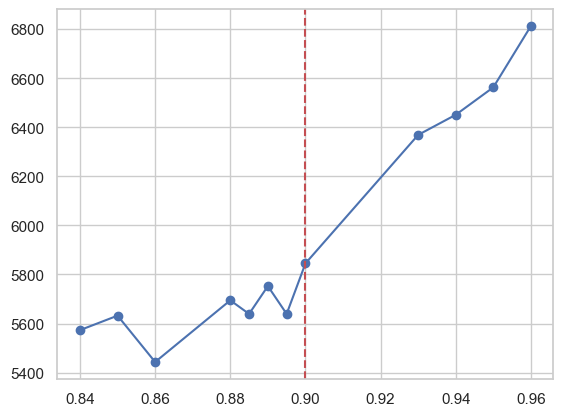

<Figure size 500x300 with 0 Axes>

In [47]:
median_spo = main.groupby('spo')['yield_kg'].median().reset_index()
plt.plot(median_spo['spo'], median_spo['yield_kg'], marker='o', linestyle='-')
plt.axvline(x=0.90, color='r', linestyle='--', label='0.90')
plt.figure(figsize=(5,3))
plt.show()

Разделим `spo`: значения < 0.90 равно 0 , значения > 90 равно 1.

In [48]:
main_lm_2 = main_lm.copy(deep=True)
main_lm_2.head(3)

,index,yield_kg,eke,protein_g,spo,cow_breed,pasture_type,dad_breed,age
0,0,5863,14.200,1743,0.890,Вис Бик Айдиал,равнинное,Айдиал,более_2_лет
1,1,5529,12.800,2138,0.890,Вис Бик Айдиал,равнинное,Соверин,менее_2_лет
2,2,5810,14.000,1854,0.885,РефлешнСоверинг,холмистое,Соверин,более_2_лет


In [49]:
main_lm_2['spo_cat'] =  main_lm_2['spo'].apply(lambda x: 1 if x > 0.90 else 0)
main_lm_2['eke_2'] =  main_lm_2['eke'] ** 2

main_lm_2 = main_lm_2.drop(['eke', 'spo'], axis=1)
print(display(main_lm_2.head(5)))
main_lm_2.shape

,index,yield_kg,protein_g,cow_breed,pasture_type,dad_breed,age,spo_cat,eke_2
0,0,5863,1743,Вис Бик Айдиал,равнинное,Айдиал,более_2_лет,0,201.640
1,1,5529,2138,Вис Бик Айдиал,равнинное,Соверин,менее_2_лет,0,163.840
2,2,5810,1854,РефлешнСоверинг,холмистое,Соверин,более_2_лет,0,196.000
3,3,5895,2012,РефлешнСоверинг,холмистое,Айдиал,более_2_лет,0,153.760
4,4,5302,1675,Вис Бик Айдиал,равнинное,Соверин,менее_2_лет,0,163.840


None


(628, 9)

Приступаем к обучению второй модели.

In [50]:
X = main_lm_2.drop('yield_kg', axis=1)
y = main_lm_2['yield_kg']
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size =0.25,
    random_state = RANDOM_STATE
)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(471, 8)
(157, 8)
(471,)
(157,)


In [51]:
# Стандартизация
num_col_names = ['eke_2', 'protein_g']
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train[num_col_names])
X_test_scaled = scaler.transform(X_test[num_col_names])

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_col_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_col_names)

# Кодироание
cat_col_names = ['cow_breed', 'pasture_type', 'dad_breed', 'age', 'spo_cat']
encoder = OneHotEncoder(drop='first', sparse=False)
X_train_ohe = encoder.fit_transform(X_train[cat_col_names])
X_test_ohe = encoder.transform(X_test[cat_col_names])

encoder_col_names = encoder.get_feature_names(cat_col_names) 
X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

# Обучаем модель
model_lr_2= LinearRegression()
model_lr_2.fit(X_train, y_train)
prediction_2 = model_lr_2.predict(X_test)

# Коэффициент детерминации
r2_2 = r2_score(
    y_test,
    prediction_2
)
print("Коэффициент детерминации R^2:", r2_2)

Коэффициент детерминации R^2: 0.8180879926867503


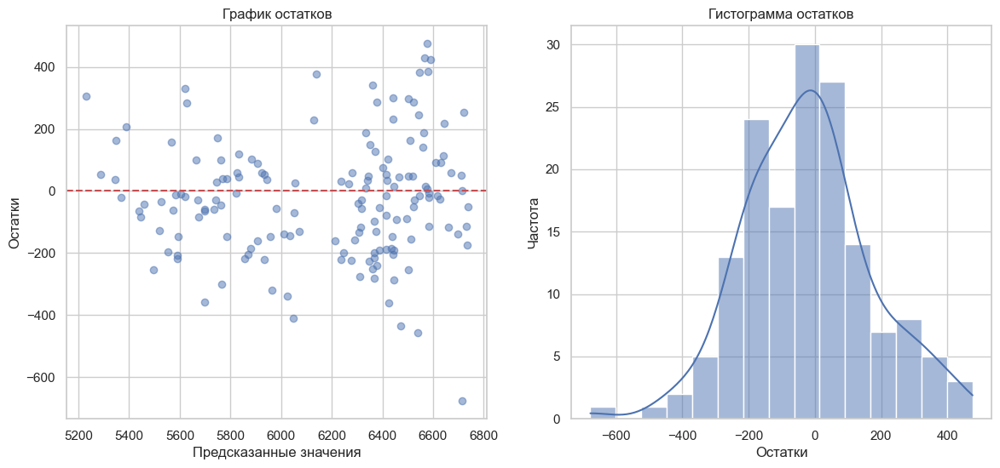

In [52]:
residuals_2 = y_test - prediction_2
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.scatter(prediction_2, residuals_2, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('График остатков')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.grid(True)

# Гистограмма остатков
plt.subplot(1, 2, 2)
sns.histplot(residuals_2, kde=True)
plt.title('Гистограмма остатков')
plt.xlabel('Остатки')
plt.ylabel('Частота')
plt.grid(True)

plt.show()

Коэффициент детерминации после улучшения линейной зависимости увеличился и составляет 0.818. На графиках распределения остатков изменения на гистограмме видны слабо, модель все так же завышает результаты. На диаграмме рассеяния остатков точки распределены более равномерно, чем на прошлой.

#### 5.3. Третья модель линейной регрессии

Добавим новый признак `dad_name` из датафрейма `dad`.

In [53]:
main_dad =  main.merge(dad, on='id', how='left')

main_dad['spo_cat'] =  main_dad['spo'].apply(lambda x: 1 if x > 0.90 else 0)
main_dad['eke_2'] =  main_dad['eke'] ** 2

main_dad = main_dad.drop(['eke', 'spo','id','fat_share','protein_share','taste'], axis=1)
print(display(main_dad.head(5)))
main_dad.shape

,index,yield_kg,protein_g,cow_breed,pasture_type,dad_breed,age,dad_name,spo_cat,eke_2
0,0,5863,1743,Вис Бик Айдиал,равнинное,Айдиал,более_2_лет,Буйный,0,201.640
1,1,5529,2138,Вис Бик Айдиал,равнинное,Соверин,менее_2_лет,Соловчик,0,163.840
2,2,5810,1854,РефлешнСоверинг,холмистое,Соверин,более_2_лет,Барин,0,196.000
3,3,5895,2012,РефлешнСоверинг,холмистое,Айдиал,более_2_лет,Буйный,0,153.760
4,4,5302,1675,Вис Бик Айдиал,равнинное,Соверин,менее_2_лет,Барин,0,163.840


None


(628, 10)

In [54]:
X = main_dad.drop('yield_kg', axis=1)
y = main_dad['yield_kg']

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size =0.25,
    random_state=RANDOM_STATE
)

X_train_cow = pd.concat([X_train, X_test], ignore_index=True)
y_train_cow = pd.concat([y_train, y_test], ignore_index=True)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(471, 9)
(157, 9)
(471,)
(157,)


In [55]:
# Стандартизация
num_col_names = ['eke_2', 'protein_g']
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train[num_col_names])
X_test_scaled = scaler.transform(X_test[num_col_names])

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_col_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_col_names)

# Кодирование
cat_col_names = ['cow_breed', 'pasture_type', 'dad_breed', 'age', 'spo_cat', 'dad_name']
encoder = OneHotEncoder(drop='first', sparse=False)
X_train_ohe = encoder.fit_transform(X_train[cat_col_names])
X_test_ohe = encoder.transform(X_test[cat_col_names])

encoder_col_names = encoder.get_feature_names(cat_col_names) 
X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

# Обучаем модель
model_lr_3= LinearRegression()
model_lr_3.fit(X_train, y_train)
prediction_3 = model_lr_3.predict(X_test)

# Коэффициент детерминации
r2_3 = r2_score(
    y_test,
    prediction_3
)
print("Коэффициент детерминации R^2:", r2_3)

Коэффициент детерминации R^2: 0.8247542745210408


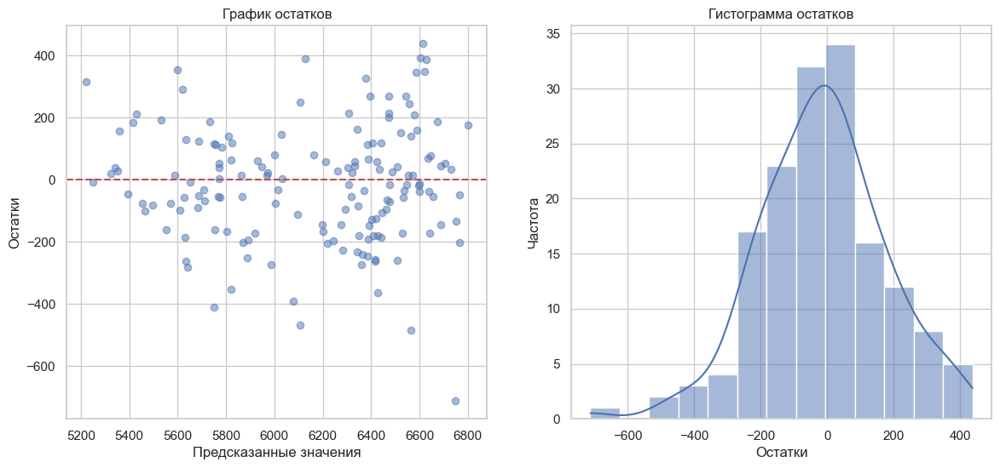

In [56]:
residuals_3 = y_test - prediction_3
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.scatter(prediction_3, residuals_3, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('График остатков')
plt.xlabel('Предсказанные значения')
plt.ylabel('Остатки')
plt.grid(True)

# Гистограмма остатков
plt.subplot(1, 2, 2)
sns.histplot(residuals_3, kde=True)
plt.title('Гистограмма остатков')
plt.xlabel('Остатки')
plt.ylabel('Частота')
plt.grid(True)

plt.show()

#### 5.4. Сравнение моделей

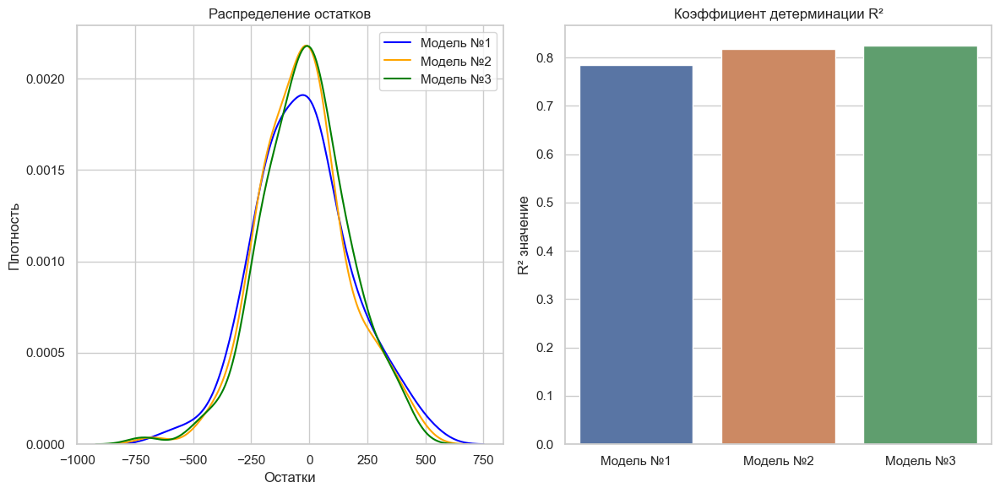

In [57]:
plt.figure(figsize=(12, 6))

# График остатков
plt.subplot(1, 2, 1)
sns.kdeplot(residuals, label='Модель №1', color='blue')
sns.kdeplot(residuals_2, label='Модель №2', color='orange')
sns.kdeplot(residuals_3, label='Модель №3', color='green')
plt.title('Распределение остатков')
plt.xlabel('Остатки')
plt.ylabel('Плотность')
plt.legend()

# График R^2
plt.subplot(1, 2, 2)
r2_values = [0.7844078173416968, 0.8180879926867503, 0.8247542745210408]
models = ['Модель №1', 'Модель №2', 'Модель №3']
sns.barplot(x=models, y=r2_values)
plt.title('Коэффициент детерминации R²')
plt.ylabel('R² значение')

plt.tight_layout()
plt.show()

Коэффициент детерминации лучше всего у модели №3, но при этом остатки ближе к нулю у первой модели.

#### 5.5. Оценка моделей по метрикам

Оценим каждую модель по метрикам MSE(cреднеквадратичная ошибка), RMSE(корень среднеквадратичной ошибки), MAE(средняя абсолютная ошибка). 

In [58]:
def MSE (y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    return mse

def RMSE (y_true, y_pred):
    rmse = mean_squared_error(y_true, y_pred, squared=False)
    return rmse

def MAE (y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    return mae

MSE_1 = MSE(y_test,prediction)
RMSE_1 = RMSE(y_test,prediction)
MAE_1 = MAE(y_test,prediction)

MSE_2 = MSE(y_test,prediction_2)
RMSE_2 = RMSE(y_test,prediction_2)
MAE_2 = MAE(y_test,prediction_2)

MSE_3 = MSE(y_test,prediction_3)
RMSE_3 = RMSE(y_test,prediction_3)
MAE_3 = MAE(y_test,prediction_3)

print(f'Метрики медели №1: MSE - {MSE_1}, RMSE - {RMSE_1}, MAE - {MAE_1}')
print(f'Метрики медели №2: MSE - {MSE_2}, RMSE - {RMSE_2}, MAE - {MAE_2}')
print(f'Метрики медели №3: MSE - {MSE_3}, RMSE - {RMSE_3}, MAE - {MAE_3}')

Метрики медели №1: MSE - 43887.01500966049, RMSE - 209.49227911706075, MAE - 164.2419446347492
Метрики медели №2: MSE - 37030.911311136944, RMSE - 192.43417396901452, MAE - 149.03965222364602
Метрики медели №3: MSE - 35673.88988618191, RMSE - 188.8753289505591, MAE - 146.16302445362308


Определим 95% доверительный интервал лучшей модели (модели №3).

In [59]:
lower_quartile = np.quantile(residuals_3, 0.025)
upper_quartile = np.quantile(residuals_3, 0.975)
print(f'95% доверительный интервал ошибки модели №3: {lower_quartile} <--> {upper_quartile}')

lower_quartile = np.quantile(prediction_3, 0.025)
upper_quartile = np.quantile(prediction_3, 0.975)
print(f'95% доверительный интервал модели №3: {lower_quartile} <--> {upper_quartile}')

95% доверительный интервал ошибки модели №3: -393.099637079012 <--> 355.93715119412155
95% доверительный интервал модели №3: 5351.318280574307 <--> 6749.077628641808


Наименьшие значения по всем трем метрикам у модели №3, у этой же модели наибольшее значение коэффициента детерминации, так что следует выбрать это модель для дальнейшей работы.  
**Доверительный интервал** [5351.3, 6749.1]. Это означает, что с 95% вероятностью истинное среднее значение попадает в этот диапазон. Доверительный интервал ошибки [-393.1, 355.9].

#### 5.6. Прогноз удоя коров "Экофермы"

Применим модель №3 к датафрейму `cow` предварительно добавив колонки из датафрейма `main`.

In [60]:
cow_lm = cow.copy()

for_cow = main[['eke', 'protein_g', 'spo']].mean() * 1.05

cow_lm['eke'] = for_cow['eke']
cow_lm['eke_2'] = for_cow['eke'] ** 2
cow_lm['protein_g'] = for_cow['protein_g']
cow_lm['spo'] = for_cow['spo']
cow_lm['spo_cat'] = 1 if for_cow['spo'] > 0.90 else 0

cow_lm = cow_lm.drop(['protein_share', 'fat_share','eke', 'spo'], axis=1)
print(display(X_train_cow.head(5)), X_train_cow.shape)
print(display(cow_lm.head(), cow_lm.shape))

,index,protein_g,cow_breed,pasture_type,dad_breed,age,dad_name,spo_cat,eke_2
0,508,2123,РефлешнСоверинг,холмистое,Соверин,более_2_лет,Соловчик,1,272.250
1,383,1889,РефлешнСоверинг,холмистое,Соверин,менее_2_лет,Барин,0,156.250
2,587,1671,Вис Бик Айдиал,равнинное,Айдиал,более_2_лет,Буйный,0,216.090
3,197,2063,Вис Бик Айдиал,холмистое,Айдиал,более_2_лет,Буйный,1,207.360
4,328,2077,Вис Бик Айдиал,равнинное,Айдиал,более_2_лет,Геркулес,0,171.610


None (628, 9)


,index,cow_breed,pasture_type,dad_breed,dad_name,age,eke_2,protein_g,spo_cat
0,0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,более_2_лет,233.361,"2,019.948",1
1,1,Вис Бик Айдиал,равнинное,Соверин,Буйный,менее_2_лет,233.361,"2,019.948",1
2,2,РефлешнСоверинг,равнинное,Соверин,Барин,более_2_лет,233.361,"2,019.948",1
3,3,РефлешнСоверинг,холмистое,Айдиал,Буйный,более_2_лет,233.361,"2,019.948",1
4,4,РефлешнСоверинг,равнинное,Айдиал,Буйный,более_2_лет,233.361,"2,019.948",1


(16, 9)

None


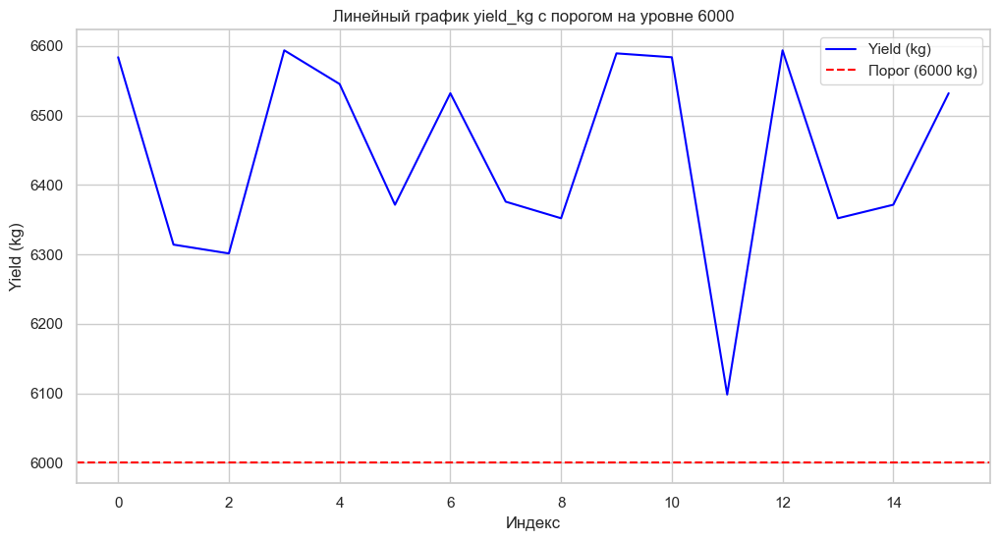

,index,cow_breed,pasture_type,dad_breed,dad_name,age,eke_2,protein_g,spo_cat,yield_kg
0,0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,более_2_лет,233.361,"2,019.948",1,"6,583.691"
1,1,Вис Бик Айдиал,равнинное,Соверин,Буйный,менее_2_лет,233.361,"2,019.948",1,"6,313.938"
2,2,РефлешнСоверинг,равнинное,Соверин,Барин,более_2_лет,233.361,"2,019.948",1,"6,301.241"
3,3,РефлешнСоверинг,холмистое,Айдиал,Буйный,более_2_лет,233.361,"2,019.948",1,"6,593.677"
4,4,РефлешнСоверинг,равнинное,Айдиал,Буйный,более_2_лет,233.361,"2,019.948",1,"6,545.137"
5,5,РефлешнСоверинг,равнинное,Соверин,Геркулес,менее_2_лет,233.361,"2,019.948",1,"6,371.352"
6,7,Вис Бик Айдиал,равнинное,Соверин,Буйный,более_2_лет,233.361,"2,019.948",1,"6,531.868"
7,9,РефлешнСоверинг,холмистое,Айдиал,Буйный,менее_2_лет,233.361,"2,019.948",1,"6,375.747"
8,10,Вис Бик Айдиал,холмистое,Соверин,Соловчик,более_2_лет,233.361,"2,019.948",1,"6,351.885"
9,11,РефлешнСоверинг,равнинное,Соверин,Геркулес,более_2_лет,233.361,"2,019.948",1,"6,589.282"


In [61]:
# Стандартизация
num_col_names = ['eke_2', 'protein_g']
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_cow[num_col_names])
X_test_scaled = scaler.transform(cow_lm[num_col_names])

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_col_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_col_names)

# Кодирование
cat_col_names = ['cow_breed', 'pasture_type', 'dad_breed', 'age', 'spo_cat', 'dad_name']
encoder = OneHotEncoder(drop='first', sparse=False)
X_train_ohe = encoder.fit_transform(X_train_cow[cat_col_names])
X_test_ohe = encoder.transform(cow_lm[cat_col_names])

encoder_col_names = encoder.get_feature_names(cat_col_names) 
X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

# Обучаем модель
target_model= LinearRegression()
target_model.fit(X_train, y_train_cow)
target_prediction = target_model.predict(X_test)

cow_lm['yield_kg'] = target_prediction

plt.figure(figsize=(12, 6))
plt.plot(cow_lm['yield_kg'], label='Yield (kg)', color='blue')  # Линейный график
plt.axhline(y=6000, color='red', linestyle='--', label='Порог (6000 kg)')

plt.title('Линейный график yield_kg с порогом на уровне 6000')
plt.xlabel('Индекс')
plt.ylabel('Yield (kg)')
plt.legend()  
plt.grid(True)
plt.show() 

cow_lm

In [62]:
cow['yield_kg_target'] = target_prediction
cow

,index,cow_breed,pasture_type,dad_breed,dad_name,fat_share,protein_share,age,yield_kg_target
0,0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,3.580,3.076,более_2_лет,"6,583.691"
1,1,Вис Бик Айдиал,равнинное,Соверин,Буйный,3.540,3.081,менее_2_лет,"6,313.938"
2,2,РефлешнСоверинг,равнинное,Соверин,Барин,3.590,3.074,более_2_лет,"6,301.241"
3,3,РефлешнСоверинг,холмистое,Айдиал,Буйный,3.400,3.061,более_2_лет,"6,593.677"
4,4,РефлешнСоверинг,равнинное,Айдиал,Буйный,3.640,3.074,более_2_лет,"6,545.137"
5,5,РефлешнСоверинг,равнинное,Соверин,Геркулес,3.630,3.053,менее_2_лет,"6,371.352"
6,7,Вис Бик Айдиал,равнинное,Соверин,Буйный,3.570,3.079,более_2_лет,"6,531.868"
7,9,РефлешнСоверинг,холмистое,Айдиал,Буйный,3.400,3.079,менее_2_лет,"6,375.747"
8,10,Вис Бик Айдиал,холмистое,Соверин,Соловчик,3.730,3.055,более_2_лет,"6,351.885"
9,11,РефлешнСоверинг,равнинное,Соверин,Геркулес,3.730,3.073,более_2_лет,"6,589.282"


Применив модель машинного обучения мы получили прогноз удоя коров "Экофермы". Удой составил от 6098.1 кг до 6593.6 кг. Данные значения входят в 95% доверительный интервал.

#### 5.7. Промежуточный вывод

**Цель:** обучить модели линейной регресии.    
**Задачи:**
1. Обучить три модели.
2. Сравнить и оценить модели по метрикам.  
3. Спрогнозировать удой коров "Экофермы".

**Результаты**

1) Обучить три модели: (при подготовке данных использовалось кодирование и стандартизация)
- Первая: коэффициент детерминации равен 0.784, категориальные признаки `cow_breed, pasture_type, dad_breed, age`, количественные `eke, spo, protein_g`.
- Вторая: перевели `spo` в категориальный признак разделив значения по порогу в 0.90 которые поместили в новый столбец `spo_cat`, вохвели в квадрат `eke` получили новый столбец `eke_2`, у новой модели коэффициент детерминации равен 0.818.
- Третья: добавили столбец `dad_name`, коэффициент детерминации равен 0.824.

2) Сравнить и оценить модели по метрикам:
- Коэффициент детерминации лучше всего у модели №3, но при этом остатки ближе к нулю у первой модели, распределение остатков ближе к нормальному у модели №3.
- Самые низкие значения метрик у модели №3: MSE - 35673.88, RMSE - 188.87, MAE - 146.16.
- Доверительный интервал [5351.3, 6749.1].

3) Спрогнозировать удой коров "Экофермы":
- Все коровы "Экофермы" дадут за год более 6000 кг молока. Полученные значения входят в доверительный интервал.

# Шаг 6

#### 6.1. Обучение модели логистической регрессии

Обучим модель логистической регрессии по целевому признаку `taste / вкус`.

In [63]:
log_taste = main.copy()

log_taste['eke_2'] = log_taste['eke'] ** 2
log_taste['spo_cat'] = (log_taste['spo'] > 0.90).astype(int)
log_taste['taste_cat'] = (log_taste['taste'] == 'вкусно').astype(int)

log_taste = log_taste.drop(['id','yield_kg','eke','spo','taste'], axis=1)

log_taste.head(3)

,index,protein_g,cow_breed,pasture_type,dad_breed,fat_share,protein_share,age,eke_2,spo_cat,taste_cat
0,0,1743,Вис Бик Айдиал,равнинное,Айдиал,3.580,3.076,более_2_лет,201.640,0,1
1,1,2138,Вис Бик Айдиал,равнинное,Соверин,3.540,3.079,менее_2_лет,163.840,0,1
2,2,1854,РефлешнСоверинг,холмистое,Соверин,3.590,3.074,более_2_лет,196.000,0,0


In [64]:
X = log_taste.drop('taste_cat', axis=1)
y = log_taste['taste_cat']

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size =0.25,
    random_state=RANDOM_STATE
)
X_train_taste = pd.concat([X_train, X_test], ignore_index=True)
y_train_taste = pd.concat([y_train, y_test], ignore_index=True)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(471, 10)
(157, 10)
(471,)
(157,)


Accuracy: 62.42038216560509
Precision: 61.98347107438017
Recall: 85.22727272727273


Text(0.5, 20.049999999999997, 'False label')

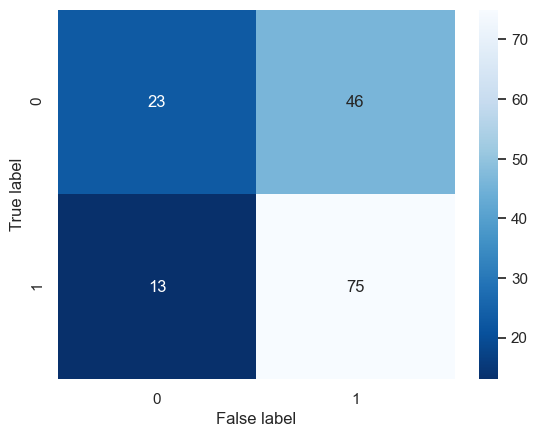

In [65]:
# Стандартизация
num_col_names = ['eke_2', 'protein_g', 'fat_share', 'protein_share']
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train[num_col_names])
X_test_scaled = scaler.transform(X_test[num_col_names])

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_col_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_col_names)

# Кодирование
cat_col_names = ['cow_breed', 'pasture_type', 'dad_breed', 'age', 'spo_cat']
encoder = OneHotEncoder(drop='first', sparse=False)
X_train_ohe = encoder.fit_transform(X_train[cat_col_names])
X_test_ohe = encoder.transform(X_test[cat_col_names])

encoder_col_names = encoder.get_feature_names(cat_col_names) 
X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

# Обучение модели
clf = LogisticRegression()
clf = clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:,1]

# Расчет метрик
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print(f'''Accuracy: {accuracy * 100}
Precision: {precision * 100}
Recall: {recall * 100}''')

# Матрица ошибок
cm = confusion_matrix(
    y_test,
    y_pred
)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r')
plt.ylabel('True label')
plt.xlabel('False label')

#### 6.2. Анализ модели логистической регрессии

Точность (Accuracy) предсказаний составила 62.4%. Точность положительных результатов (Precision) - 61.98% всех предсказанных "вкусно" действительно являются "вкусными". Полнота (Recall) 85.3% всех случаев "вкусно" были правильно предсказаны как "вкусно". 
Для заказчика важнее показатель точности положительности результатов (Precision), так как полнота (recall) не учитывает ложноположительные результаты, а для нашей задачи непростительно позволить случайно купить коров, которые дают "невкусное" молоко. А с ложноположительными результатами у нынешней модели дела обстоят не очень, на 75 True Positiv приходится 46 False Positive. То есть для нас атуальна ошибка первого рода - модель ошибочно классифицирует пример, как положительный.   
Поэксперементируем с порогом классификации.

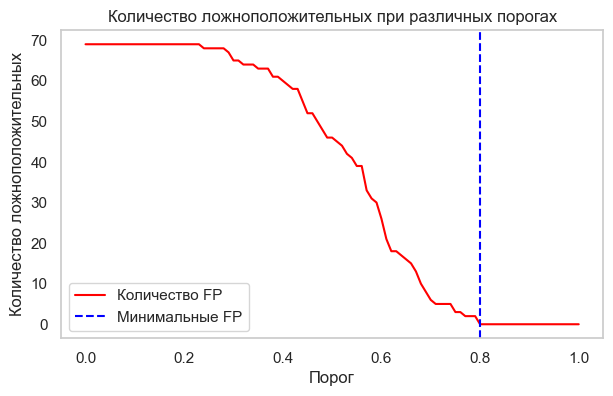

Оптимальный порог для минимизации FP: 0.8


In [66]:
thresholds = np.arange(0, 1.01, 0.01) 
fps = [] 
tps = [] 
tns = [] 
fns = [] 

for threshold in thresholds:
    predicted_classes = (y_proba >= threshold).astype(int)
    
    tn, fp, fn, tp = confusion_matrix(y_test, predicted_classes).ravel()
    
    fps.append(fp)
    tps.append(tp)
    tns.append(tn)
    fns.append(fn)

plt.figure(figsize=(7, 4))
plt.plot(thresholds, fps, label='Количество FP', color='red')
plt.xlabel('Порог')
plt.ylabel('Количество ложноположительных')
plt.title('Количество ложноположительных при различных порогах')
plt.axvline(x=thresholds[np.argmin(fps)], color='blue', linestyle='--', label='Минимальные FP')
plt.legend()
plt.grid()
plt.show()

optimal_threshold = thresholds[np.argmin(fps)]
print(f'Оптимальный порог для минимизации FP: {optimal_threshold}')

In [67]:
thresholds = np.arange(0, 1.01, 0.01) 
fp_counts = []
precision_scores = []
tp_counts = []
recall_scores = []

for threshold in thresholds:
    predicted_classes = (y_proba >= threshold).astype(int)
    
    tn, fp, fn, tp = confusion_matrix(y_test, predicted_classes).ravel()
    
    fp_counts.append(fp)
    precision = precision_score(y_test, predicted_classes, zero_division=0)
    precision_scores.append(precision)
    tp_counts.append(tp)
    recall = recall_score(y_test, predicted_classes, zero_division=0) 
    recall_scores.append(recall)

results_df = pd.DataFrame({
    'Порог': thresholds,
    'Recall': recall_scores, 
    'Precision': precision_scores,
    'Количество FP': fp_counts,
    'Количество TP': tp_counts
})

print(display(results_df.query('Precision == 1')))

,Порог,Recall,Precision,Количество FP,Количество TP
80,0.800,0.080,1.000,0,7
81,0.810,0.057,1.000,0,5
82,0.820,0.057,1.000,0,5
83,0.830,0.034,1.000,0,3


None


При пороге 0.8 метрика Precision = 100%, но очень страдает метрика Recall = 8%. Попытаемся найти более приемлемые значения.

In [68]:
results_df.query('Precision >= 0.8')

,Порог,Recall,Precision,Количество FP,Количество TP
69,0.690,0.432,0.826,8,38
70,0.700,0.420,0.860,6,37
71,0.710,0.386,0.872,5,34
72,0.720,0.375,0.868,5,33
73,0.730,0.330,0.853,5,29
74,0.740,0.250,0.815,5,22
75,0.750,0.227,0.870,3,20
76,0.760,0.170,0.833,3,15
77,0.770,0.170,0.882,2,15
78,0.780,0.125,0.846,2,11


Предлагаю выбрать пороговое значение 0.71 при котором Precision = 87%, Recall = 38%.

Accuracy: 62.42038216560509
Precision: 87.17948717948718
Recall: 38.63636363636363


Text(0.5, 20.049999999999997, 'False label')

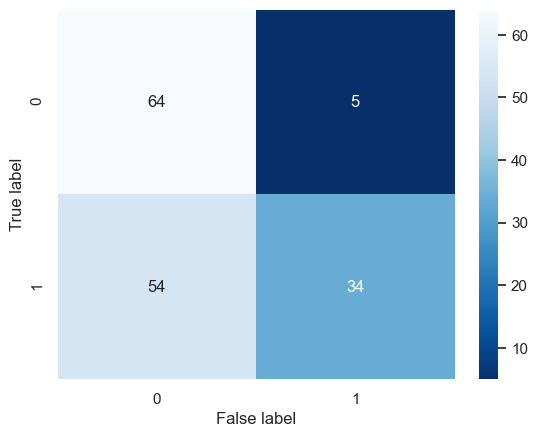

In [69]:
threshold = 0.71

y_pred_new = (y_proba >= threshold).astype('int')

accuracy = accuracy_score(y_test, y_pred_new)
precision = precision_score(y_test, y_pred_new)
recall = recall_score(y_test, y_pred_new)

print(f'''Accuracy: {accuracy * 100}
Precision: {precision * 100}
Recall: {recall * 100}''')

# Матрица ошибок
cm = confusion_matrix(
    y_test,
    y_pred_new
)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r')
plt.ylabel('True label')
plt.xlabel('False label')

При пороговом значении 0.71 матрица ошибок и метрики выглядят более уравновешенно. По сравнению со значениями до изменения порога Accuracy не изменилось (62.4% до, 62.4% после), Precision выросла (61.9% до, 87.2% после), Recall снизилась (85.2% до, 40,9% после).
Сформируем новую тренировочную выборку, заново обучим модель на новый порог и выясним какие коровы подойдут фермеру.

#### 6.3. Прогноз

In [70]:
cow.head(2)

,index,cow_breed,pasture_type,dad_breed,dad_name,fat_share,protein_share,age,yield_kg_target
0,0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,3.580,3.076,более_2_лет,"6,583.691"
1,1,Вис Бик Айдиал,равнинное,Соверин,Буйный,3.540,3.081,менее_2_лет,"6,313.938"


In [71]:
log_target = cow.copy()

log_target['eke_2'] = log_taste['eke_2']
log_target['spo_cat'] = log_taste['spo_cat']
log_target['protein_g'] = log_taste['protein_g']

log_target = log_target.drop(['dad_name'], axis=1)

print(display(X_train_taste.head()), X_train_taste.shape)
display(log_target.head(), log_target.shape)

,index,protein_g,cow_breed,pasture_type,dad_breed,fat_share,protein_share,age,eke_2,spo_cat
0,508,2123,РефлешнСоверинг,холмистое,Соверин,3.700,3.074,более_2_лет,272.250,1
1,383,1889,РефлешнСоверинг,холмистое,Соверин,3.340,3.072,менее_2_лет,156.250,0
2,587,1671,Вис Бик Айдиал,равнинное,Айдиал,3.180,3.079,более_2_лет,216.090,0
3,197,2063,Вис Бик Айдиал,холмистое,Айдиал,3.620,3.079,более_2_лет,207.360,1
4,328,2077,Вис Бик Айдиал,равнинное,Айдиал,3.640,3.076,более_2_лет,171.610,0


None (628, 10)


,index,cow_breed,pasture_type,dad_breed,fat_share,protein_share,age,yield_kg_target,eke_2,spo_cat,protein_g
0,0,Вис Бик Айдиал,холмистое,Айдиал,3.580,3.076,более_2_лет,"6,583.691",201.640,0,1743
1,1,Вис Бик Айдиал,равнинное,Соверин,3.540,3.081,менее_2_лет,"6,313.938",163.840,0,2138
2,2,РефлешнСоверинг,равнинное,Соверин,3.590,3.074,более_2_лет,"6,301.241",196.000,0,1854
3,3,РефлешнСоверинг,холмистое,Айдиал,3.400,3.061,более_2_лет,"6,593.677",153.760,0,2012
4,4,РефлешнСоверинг,равнинное,Айдиал,3.640,3.074,более_2_лет,"6,545.137",163.840,0,1675


(16, 11)

In [72]:
# Стандартизация
num_col_names = ['eke_2', 'protein_g', 'fat_share', 'protein_share']
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_taste[num_col_names])
X_test_scaled = scaler.transform(log_target[num_col_names])

X_train_scaled = pd.DataFrame(X_train_scaled, columns=num_col_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=num_col_names)

# Кодирование
cat_col_names = ['cow_breed', 'pasture_type', 'dad_breed', 'age', 'spo_cat']
encoder = OneHotEncoder(drop='first', sparse=False)
X_train_ohe = encoder.fit_transform(X_train_taste[cat_col_names])
X_test_ohe = encoder.transform(log_target[cat_col_names])

encoder_col_names = encoder.get_feature_names(cat_col_names) 
X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_col_names)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_col_names)

X_train = pd.concat([X_train_ohe, X_train_scaled], axis=1)
X_test = pd.concat([X_test_ohe, X_test_scaled], axis=1)

# Обучение модели
clf.fit(X_train, y_train_taste)
y_proba = clf.predict_proba(X_test)[:, 1]
predictions_target = (y_proba > threshold).astype(int)

In [73]:
cow['milk_taste'] = predictions_target
cow['milk_taste'] = cow['milk_taste'].apply(lambda x: 'вкусно' if x == 1 else 'не вкусно')
cow_taste = cow.query('milk_taste == "вкусно"')
cow['y_pred'] = predictions_target
print(display(cow))
print(display(cow_taste.query('milk_taste == "вкусно"')))

,index,cow_breed,pasture_type,dad_breed,dad_name,fat_share,protein_share,age,yield_kg_target,milk_taste,y_pred
0,0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,3.580,3.076,более_2_лет,"6,583.691",вкусно,1
1,1,Вис Бик Айдиал,равнинное,Соверин,Буйный,3.540,3.081,менее_2_лет,"6,313.938",не вкусно,0
2,2,РефлешнСоверинг,равнинное,Соверин,Барин,3.590,3.074,более_2_лет,"6,301.241",не вкусно,0
3,3,РефлешнСоверинг,холмистое,Айдиал,Буйный,3.400,3.061,более_2_лет,"6,593.677",не вкусно,0
4,4,РефлешнСоверинг,равнинное,Айдиал,Буйный,3.640,3.074,более_2_лет,"6,545.137",не вкусно,0
5,5,РефлешнСоверинг,равнинное,Соверин,Геркулес,3.630,3.053,менее_2_лет,"6,371.352",не вкусно,0
6,7,Вис Бик Айдиал,равнинное,Соверин,Буйный,3.570,3.079,более_2_лет,"6,531.868",не вкусно,0
7,9,РефлешнСоверинг,холмистое,Айдиал,Буйный,3.400,3.079,менее_2_лет,"6,375.747",не вкусно,0
8,10,Вис Бик Айдиал,холмистое,Соверин,Соловчик,3.730,3.055,более_2_лет,"6,351.885",не вкусно,0
9,11,РефлешнСоверинг,равнинное,Соверин,Геркулес,3.730,3.073,более_2_лет,"6,589.282",не вкусно,0


None


,index,cow_breed,pasture_type,dad_breed,dad_name,fat_share,protein_share,age,yield_kg_target,milk_taste
0,0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,3.580,3.076,более_2_лет,"6,583.691",вкусно
11,13,Вис Бик Айдиал,холмистое,Соверин,Барин,3.420,3.075,менее_2_лет,"6,098.151",вкусно


None


#### 6.4. Промежуточный вывод

**Цель:** обучить модель логистической регресии.   
**Задачи:**
1. Обучить модель.
2. Проанализировать модель, подобрать порог классификации.  
3. Спрогнозировать вкус молока коров "Экофермы".

**Результаты**

1) Обучить модель: (при подготовке данных использовалось кодирование и стандартизация)
- Обучили модель используя стандартный порог классификации, получили точность предсказаний 62.4%, точность положительных результатов - 61.98%, полнота 85.3%.

2) Проанализировать модель, подобрать порог классификации:
- Принято решение увеличение значения мерики Precision, чтобы предсказание модели соответсвовало требованиям заказчика - важно, чтобы модель не предсказала покупку коровы с невкусным молоком.
- Определили, что при пороге 0.8 метрика Precision = 100%, но тогда страдает метрика Recall = 8%, поэтому за порог классификации взяли 0.71.
- По сравнению со значениями до изменения порога Accuracy не изменилось (62.4% до, 62.4% после), Precision выросла (61.9% до, 87.2% после), Recall снизилась (85.2% до, 40,9% после).

3) Спрогнозировать вкус молока коров "Экофермы":
- Переобучили модель и предсказали, что две коровы соответсвуют всем требованиям заказчика.

# Шаг 7

#### Итоговый вывод

В процессе работы над проектом для фермы "Вольный луг" были осуществлены следующие шаги:

1. **Загрузка и знакомство с данными.** Установили объем данных и переименовали столбцы во всех трех датафрейма в соответствии со snake_case.
2. **Предобработка данных, работа с пропусками и дубликатами.** Все количественные столбцы преобразованы в тип `object`, знак "," заменен на ".", а тип данных — на `float`. В датафрейме `main` удалено 5 явных дубликатов, а в `cow` — 4. Также был устранен выброс в столбце годового удоя. Исправлены неявные дубликаты в категориальных столбцах: написание типа пастбища "Равнинное" изменено на "равнинное", а порода отца коровы — с "Айдиалл" на "Айдиал".
3. **Исследовательский анализ данных, статистическое описание.** В количественных столбцах `fat_share` и `protein_share` датафрейма с информацией о коровах имеются выбросы, которые не удалены, так как их отклонение от основной группы данных несущественно. Средние значения и медиана для количественных признаков слабо различаются. Для каждого признака построены графики с помощью функций `quality_attributes` для категориальных и `quantitative_data` для количественных признаков. На графиках видно, что распределение количественных данных ненормально, вероятно, из-за специфики данных. Данные полные и корректные, улучшения не требуются.
5. **Корреляционный анализ признаков в датасете.** Для выявления корреляции был использован коэффициент Фи, поскольку среди признаков имелись категориальные. Обнаружена сильная положительная зависимость удоя от возраста коровы, жирности и ЭКЕ. Построены диаграммы рассеяния для всех количественных и качественных признаков: взаимосвязь между удоем и большинством признаков линейная, за исключением `spo` и `protein_share`. `spo` переведен в категориальные признаки для достижения линейности. Мультиколлинеарность отсутствует.
6. **Обучение моделей линейной регрессии.** Обучены три модели с использованием кодирования и стандартизации. Первая модель демонстрирует коэффициент детерминации 0.784 с признаками `cow_breed`, `pasture_type`, `dad_breed`, `age`, а также количественными `eke`, `spo`, `protein_g`. Во второй модели `spo` был переведен в категориальный признак, а `eke` возведен в квадрат, что улучшило коэффициент до 0.818. Третья модель, в которую добавили столбец `dad_name`, достигла коэффициента 0.824. Сравнение моделей показывает, что третья модель имеет лучший коэффициент детерминации и более нормальное распределение остатков. Метрики для третьей модели: MSE - 35673.88, RMSE - 188.87, MAE - 146.16, доверительный интервал — [5351.3, 6749.1]. Прогноз для коров "Экофермы": все коровы дадут более 6000 кг молока в год, полученные значения входят в доверительный интервал.
7. **Обучение моделей логистической регрессии.** Обучили модель с использованием кодирования и стандартизации, получив точность предсказаний 62.4%, точность положительных результатов 61.98% и полноту 85.3%. Для повышения метрики Precision, важной для заказчика, установлен порог классификации 0.71. При этом Precision увеличился с 61.9% до 87.2%, а Recall снизился с 85.2% до 40.9%.  После переобучения модели прогнозировано, что две коровы "Экофермы" соответствуют всем требованиям заказчика.

**Итоговая таблица с результатми предсказаний**

In [74]:
cow

,index,cow_breed,pasture_type,dad_breed,dad_name,fat_share,protein_share,age,yield_kg_target,milk_taste,y_pred
0,0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,3.580,3.076,более_2_лет,"6,583.691",вкусно,1
1,1,Вис Бик Айдиал,равнинное,Соверин,Буйный,3.540,3.081,менее_2_лет,"6,313.938",не вкусно,0
2,2,РефлешнСоверинг,равнинное,Соверин,Барин,3.590,3.074,более_2_лет,"6,301.241",не вкусно,0
3,3,РефлешнСоверинг,холмистое,Айдиал,Буйный,3.400,3.061,более_2_лет,"6,593.677",не вкусно,0
4,4,РефлешнСоверинг,равнинное,Айдиал,Буйный,3.640,3.074,более_2_лет,"6,545.137",не вкусно,0
5,5,РефлешнСоверинг,равнинное,Соверин,Геркулес,3.630,3.053,менее_2_лет,"6,371.352",не вкусно,0
6,7,Вис Бик Айдиал,равнинное,Соверин,Буйный,3.570,3.079,более_2_лет,"6,531.868",не вкусно,0
7,9,РефлешнСоверинг,холмистое,Айдиал,Буйный,3.400,3.079,менее_2_лет,"6,375.747",не вкусно,0
8,10,Вис Бик Айдиал,холмистое,Соверин,Соловчик,3.730,3.055,более_2_лет,"6,351.885",не вкусно,0
9,11,РефлешнСоверинг,равнинное,Соверин,Геркулес,3.730,3.073,более_2_лет,"6,589.282",не вкусно,0


**Таблица с подходящими коровами на основании прогнозов**

In [75]:
cow_taste

,index,cow_breed,pasture_type,dad_breed,dad_name,fat_share,protein_share,age,yield_kg_target,milk_taste
0,0,Вис Бик Айдиал,холмистое,Айдиал,Геркулес,3.580,3.076,более_2_лет,"6,583.691",вкусно
11,13,Вис Бик Айдиал,холмистое,Соверин,Барин,3.420,3.075,менее_2_лет,"6,098.151",вкусно


Фермер может купить две коровы из стада на продажу с минимальным риском для своего бизнеса, так как они соответствуют всем требованиям по качеству молока и количеству годового удоя, что подтверждено переобученной моделями машинного обучения. 

#### Рекомендации

1. Мониторинг продуктивности, питания: Регулярно вести учет количества и качества удоя коров и их продуктивные показатели.
2. Анализ новых данных: Собирать и анализировать новые данные о коровах,например крайне важно состояние здоровья и условия содержания, что поможет в будущем корректировать и обновлять модели.
3. Разнообразие в породах: Исследовать другие породы, которые могут быть более продуктивными, для дальнейшего расширения стада.
4. Обучение персонала: Обучать сотрудников использовать аналитические инструменты и методы обработки данных, чтобы оптимизировать процессы на ферме.

**Выводы о моделях линейной и логистической регрессии**


Модели линейной регрессии:
- Модели линейной регрессии продемонстрировали хорошую способность предсказывать годовой удой коров. Последняя модель достигла коэффициента детерминации 0.824, что говорит о высокой степени объяснимости данных и хороших прогнозах удоя на основе отобранных признаков.
- Анализ остатков показал, что распределение остатков ближе к нормальному, что также свидетельствует о правильности подхода.

Модели логистической регрессии:
- Модель логистической регрессии позволила классифицировать коров по вкусу молока. Основной упор сделан на повышение метрики Precision, что критически важно для удовлетворения заказчика.
- Порог классификации был установлен на уровне 0.71, что позволило увеличить Precision до 87.2%, но снизило Recall до 40.9%. Это свидетельствует о том, что модель более аккуратно предсказывает положительные результаты, уменьшая количество ложных положительных результатов, даже если при этом пропускает некоторые истинные положительные случаи.

**Способы улучшения качества регрессионной модели**


В данной задаче были использованы следующие подходы для улучшения моделей:
- Кодирование и стандартизация данных: Эти этапы обеспечили более корректное обучение моделей.
- Проверка качества данных: Исключение дубликатов и обработка выбросов повысили общую достоверность анализа.
- Подбор порога классификации: Оптимизация порога классификации в модели логистической регрессии позволила достичь лучшего баланса между Precision и Recall.

**Возможности дальнейшего улучшения модели**


Да, возможно дальнейшее улучшение регрессионных моделей. Рекомендуются следующие шаги:
- Добавление новых признаков: Учитывая другие факторы, которые могут влиять на качество молока или его количество, например, условия содержкания, наличие заболеваний, количество отелов.
- Периодическая переобучение моделей: Регулярное обновление моделей на основе последних данных поможет поддерживать высокие показатели точности.

**Важные метрики для анализа рисков и экономических расчетов**


При анализе рисков или экономических расчетов важны следующие метрики классификации:
- Матрица ошибок: позволяет увидеть количество TP, FP, TN,FN
- Precision: Показывает, насколько точно модель идентифицирует положительные случаи, что уменьшает риск неправильной покупки.
- Recall: Указывает на способность модели находить все положительные случаи; важно для уменьшения количества пропущенных хороших коров.
- Accuracy: Общая правильность модели, однако для задач с несбалансированными классами (как в данном случае) не всегда является приоритетной метрикой.

Эти метрики помогут фермеру лучше понять эффективность модели и минимизировать экономические риски, при принятии решения о покупке коров.